# Student Details
 Prashant Timalsina <br>
 Uni. ID: 2329486

# About Dataset

**Fruit Classification( 10 class )**
 `Karim Abdulnabi`

https://www.kaggle.com/datasets/karimabdulnabi/fruit-classification10-class

**Fruit Classes**
- Apple  
- Kiwi  
- Banana  
- Cherry  
- Orange  
- Mango  
- Avocado  
- Pineapple  
- Strawberries  
- Watermelon

**Project Objective**
Multi-class Image classification using CNN model.

**Key Features**
- Image preprocessing, normalization, and augmentation.
- Training using CNN models and Transfer Learning.
- Evaluation using accuracy, precision, recall, and F1-score.


# Notebook Preparation

Google Colab

Drive Mount

In [17]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [18]:
from zipfile import ZipFile
with ZipFile('/content/drive/MyDrive/AIML/FruitClass.zip', 'r') as zip_ref:
    zip_ref.extractall('')

IMPORTS

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import os
import random
import cv2  # Import OpenCV for image processing
from PIL import Image # Import Pillow
import time
from collections import Counter


import tensorflow as tf
from tensorflow.keras.utils import to_categorical

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from tensorflow.keras import regularizers
from tensorflow.keras.regularizers import l1
# from keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, AveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

# Part A: Implementing Convolutional Neural Network from scratch

## Data Loading

In [20]:
# # Define paths
# train_dir = '/content/drive/MyDrive/Ai/Assignment/ass1/MY_data/train'
# test_dir = '/content/drive/MyDrive/Ai/Assignment/ass1/MY_data/test'

# Define paths
train_dir = '/content/FruitClass/MY_data/train'
test_dir = '/content/FruitClass/MY_data/test'


In [21]:
# Define image size
img_height, img_width = 128, 128

`load_images_from_folder` function

This function sorts classnames alphabetically
The sorted classnames are labelled 0 to 9
Extracts images from the corresponding class folder and saves the image in RGB format in the runtime memory
The images are then converted to numpy array for model to understand image data.

In [22]:
# Function to load images and labels using PIL
def load_images_from_folder(folder):
    images = []
    labels = []
    class_names = sorted(os.listdir(folder))  # Sorted class names (digit_0, digit_1, ...)
    class_map = {name: i for i, name in enumerate(class_names)}  # Map class names to labels
    for class_name in class_names:
        class_path = os.path.join(folder, class_name)
        if not os.path.isdir(class_path):
            continue
        label = class_map[class_name]
        for filename in os.listdir(class_path):
            img_path = os.path.join(class_path, filename)
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):  # Ensure valid image format
                try:
                    img = Image.open(img_path).convert("RGB")  # Ensure image has 3 channels
                    img = img.resize((img_width, img_height))
                    images.append(np.array(img))  # Convert to numpy array
                    labels.append(label)
                except Exception as e:
                    print(f"Error loading image {img_path}: {e}")
    return np.array(images), np.array(labels)

## Data Understanding, Analysis, Visualisation and Cleaning

In [23]:
# Function to count images in a directory
def count_images(directory):
    image_count = 0
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_count += 1
    return image_count

# Count images in train and test directories
train_image_count = count_images(train_dir)
test_image_count = count_images(test_dir)

print(f"Total images in train folder: {train_image_count}")
print(f"Total images in test folder: {test_image_count}")

Total images in train folder: 2301
Total images in test folder: 1025


In [24]:
# Check classes and image counts per class in training folder
if os.path.exists(train_dir):
    classes = sorted(os.listdir(train_dir))
    print("\nClasses found in Train dataset:\n")
    for i, class_name in enumerate(classes):
        class_dir = os.path.join(train_dir, class_name)
        if os.path.isdir(class_dir):
            image_files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
            print(f"{i + 1}. {class_name} - Number of images: {len(image_files)}")


Classes found in Train dataset:

1. apple - Number of images: 230
2. avocado - Number of images: 230
3. banana - Number of images: 230
4. cherry - Number of images: 230
5. kiwi - Number of images: 230
6. mango - Number of images: 231
7. orange - Number of images: 230
8. pinenapple - Number of images: 230
9. strawberry - Number of images: 230
10. watermelon - Number of images: 230


In [25]:

# Check classes and image counts per class in test folder
if os.path.exists(test_dir):
    classes = sorted(os.listdir(test_dir))
    print("\nClasses found in the test dataset:\n")
    for i, class_name in enumerate(classes):
        class_dir = os.path.join(test_dir, class_name)
        if os.path.isdir(class_dir):
            image_files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
            print(f"{i + 1}. {class_name} - Number of images: {len(image_files)}")


Classes found in the test dataset:

1. apple - Number of images: 89
2. avocado - Number of images: 105
3. banana - Number of images: 106
4. cherry - Number of images: 105
5. kiwi - Number of images: 105
6. mango - Number of images: 105
7. orange - Number of images: 97
8. pinenapple - Number of images: 105
9. strawberry - Number of images: 103
10. watermelon - Number of images: 105


In [26]:
# Load training images and labels
train_images, train_labels = load_images_from_folder(train_dir)
print(f"\nLoaded {len(train_images)} training images with labels.")


Loaded 2301 training images with labels.


In [27]:
# Check for corrupt Images in train
def check_corrupted_images(dir):
  sub_dir = [d for d in os.listdir(dir)]
  for dir in sub_dir:
    class_path = os.path.join(train_dir, dir)
    image_files = [f for f in os.listdir(class_path)]
    for image in image_files:
      image = os.path.join(class_path, image)
      try:
          with Image.open(image) as img:
              img.verify()
      except (IOError, SyntaxError) as e:
          os.remove(image)
          print(f"Removed corrupted image: {image}")
  print("No corrupted images found.")

check_corrupted_images(train_dir)

No corrupted images found.


In [28]:
# Check for corrupt Images in test
def check_corrupted_images(dir):
  sub_dir = [d for d in os.listdir(dir)]
  for dir in sub_dir:
    class_path = os.path.join(test_dir, dir)
    image_files = [f for f in os.listdir(class_path)]
    for image in image_files:
      image = os.path.join(class_path, image)
      try:
          with Image.open(image) as img:
              img.verify()
      except (IOError, SyntaxError) as e:
          os.remove(image)
          print(f"Removed corrupted image: {image}")
  print("No corrupted images found.")

check_corrupted_images(test_dir)

No corrupted images found.


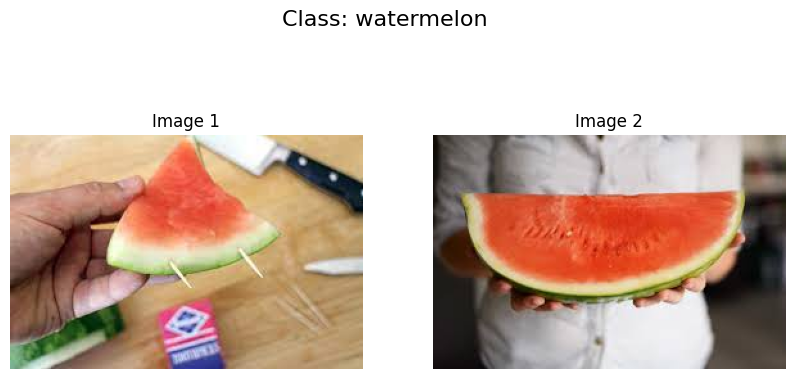

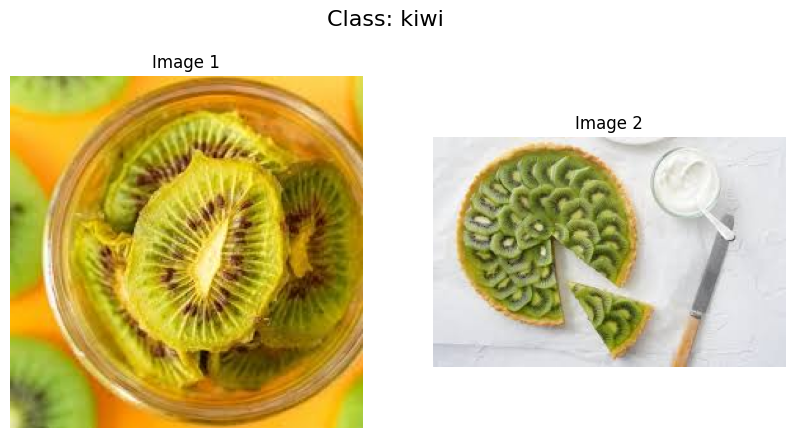

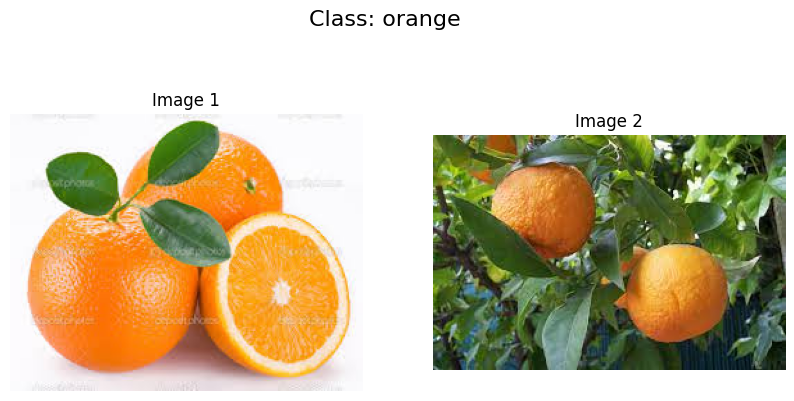

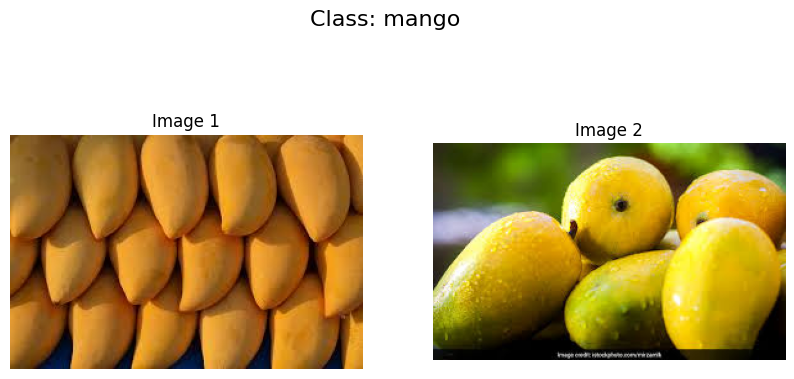

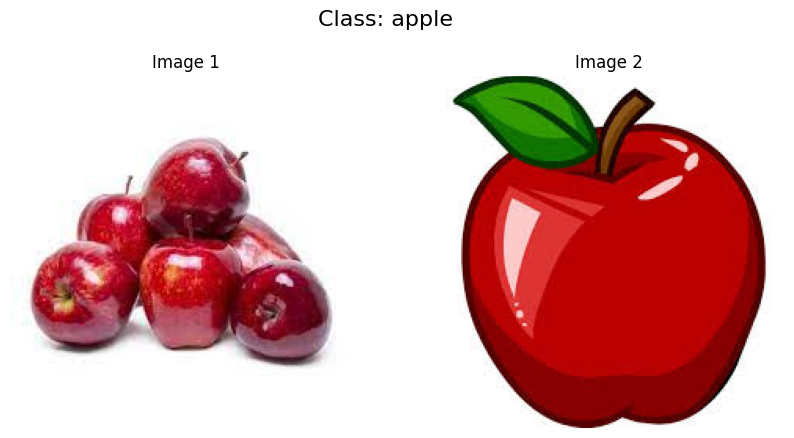

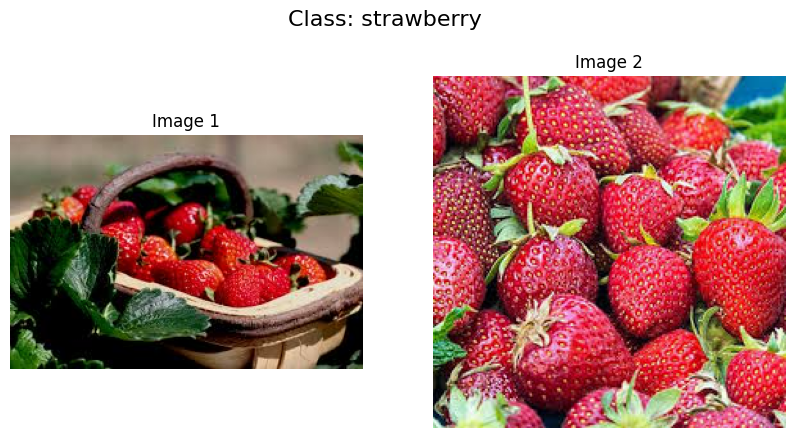

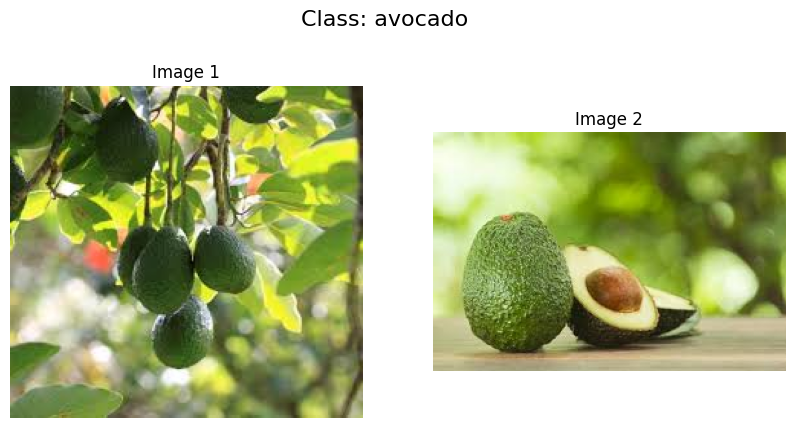

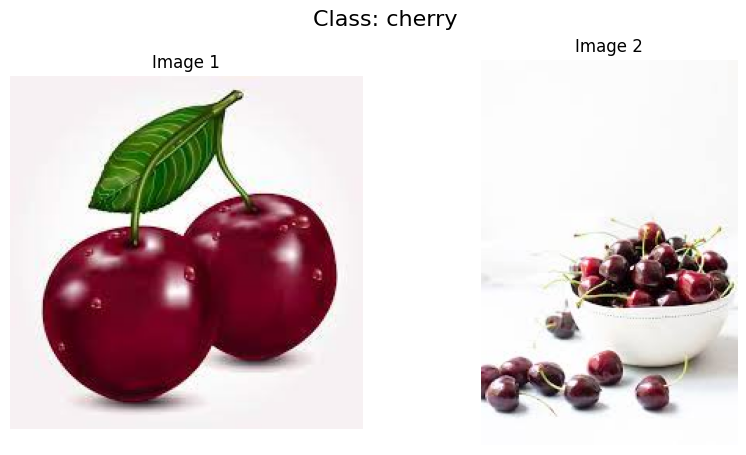

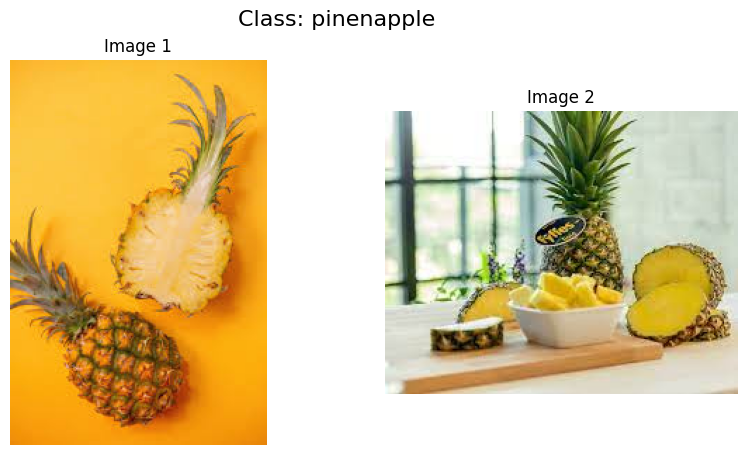

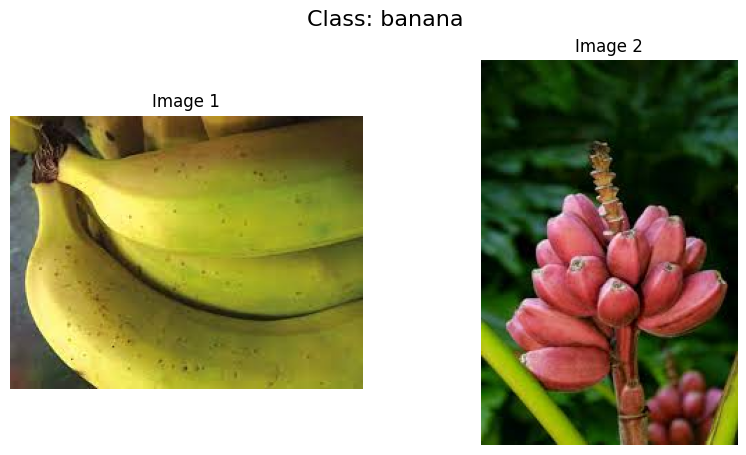

In [29]:
# Assuming 'train_dir' is the path to your training data directory
for class_name in os.listdir(train_dir):
    class_dir = os.path.join(train_dir, class_name)
    image_files = os.listdir(class_dir)

    # Create a subsection for the current class
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(f"Class: {class_name}", fontsize=16)

    # Display 2 random images for the class
    images_displayed = 0  # Counter for successfully displayed images
    while images_displayed < 2 and len(image_files) > 0:
        # Get a random image index
        random_index = random.randint(0, len(image_files) - 1)
        image_path = os.path.join(class_dir, image_files[random_index])

        # Check if the file is a valid image format before reading with cv2
        if image_files[random_index].lower().endswith(('.png', '.jpg', '.jpeg')):
            image = cv2.imread(image_path)

            # Check if the image was loaded successfully
            if image is not None:
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                axes[images_displayed].imshow(image)
                axes[images_displayed].set_title(f"Image {images_displayed + 1}")
                axes[images_displayed].axis("off")
                images_displayed += 1
            else:
                print(f"Warning: Could not read image file: {image_path}")
        else:
             print(f"Skipping non-image file: {image_path}")

        # Remove the processed or skipped file from the list to avoid infinite loops
        image_files.pop(random_index)

    # If less than 2 images were found/displayed in the class
    while images_displayed < 2:
        axes[images_displayed].set_title("No more valid images found")
        axes[images_displayed].axis("off")
        images_displayed += 1


    plt.show()

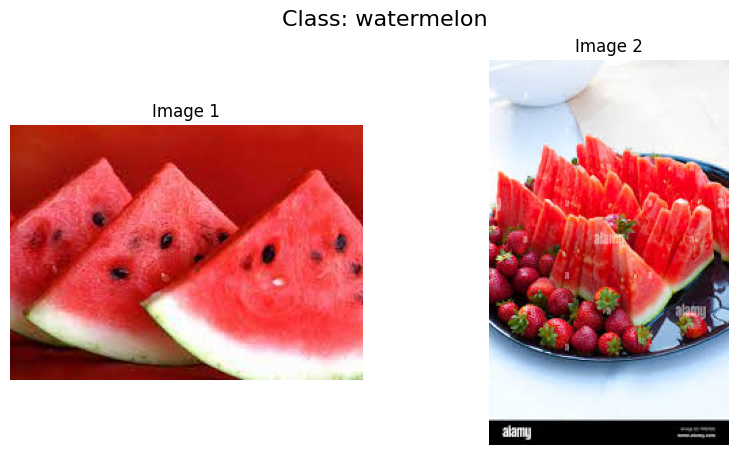

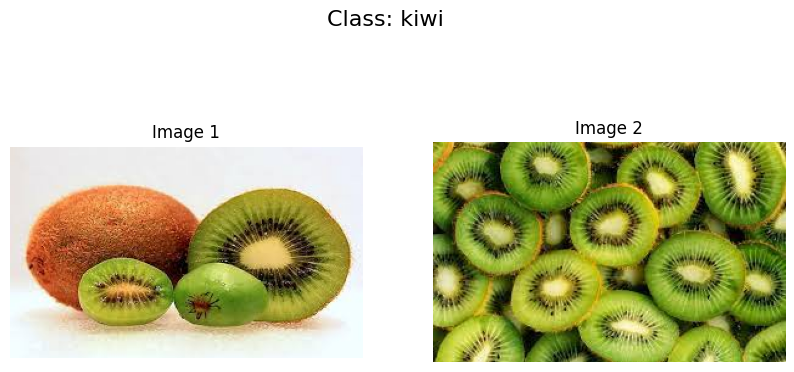

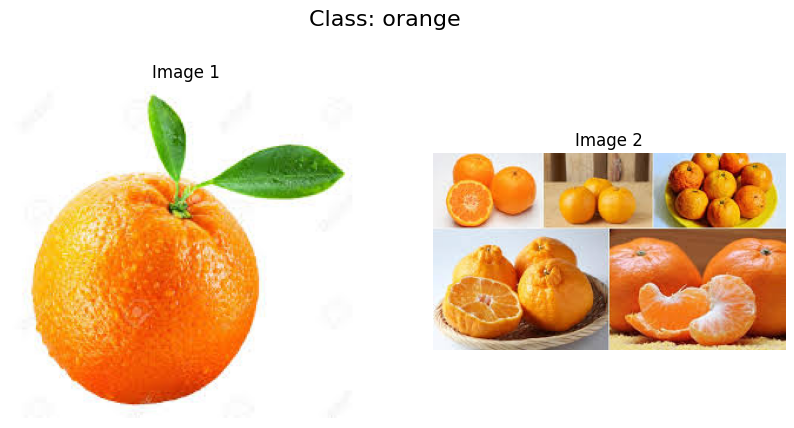

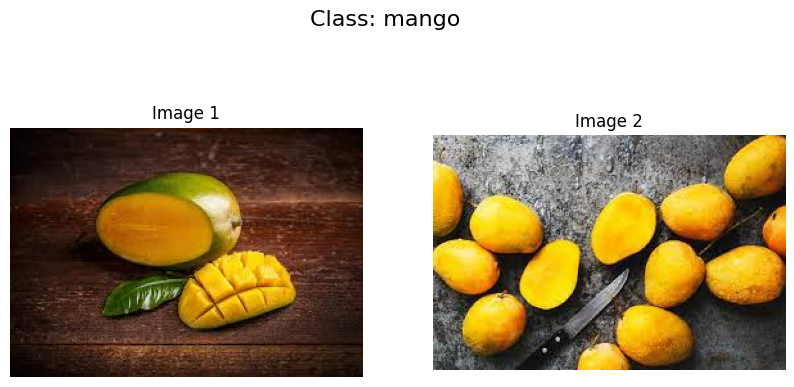

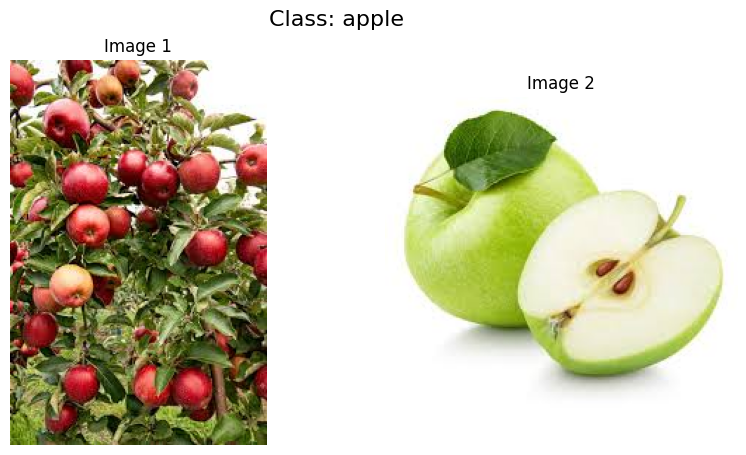

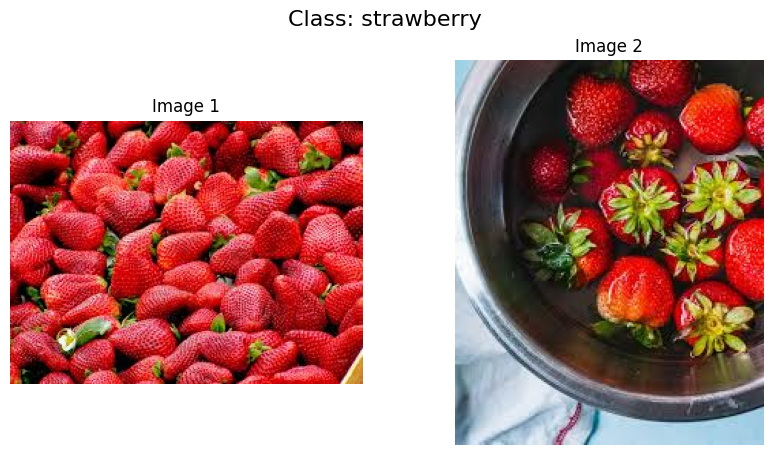

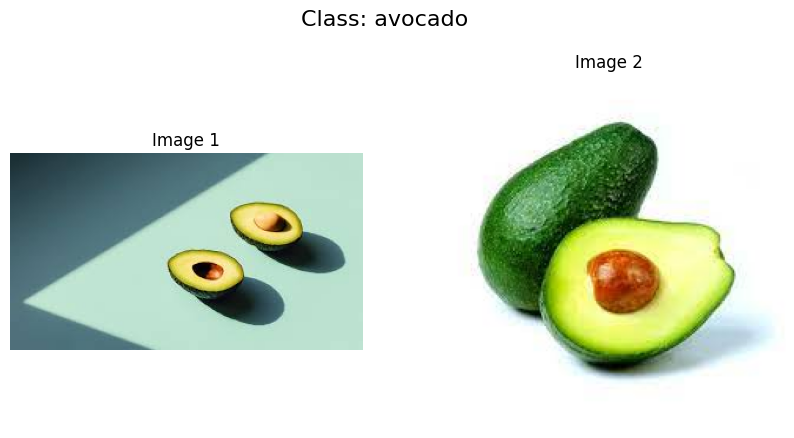

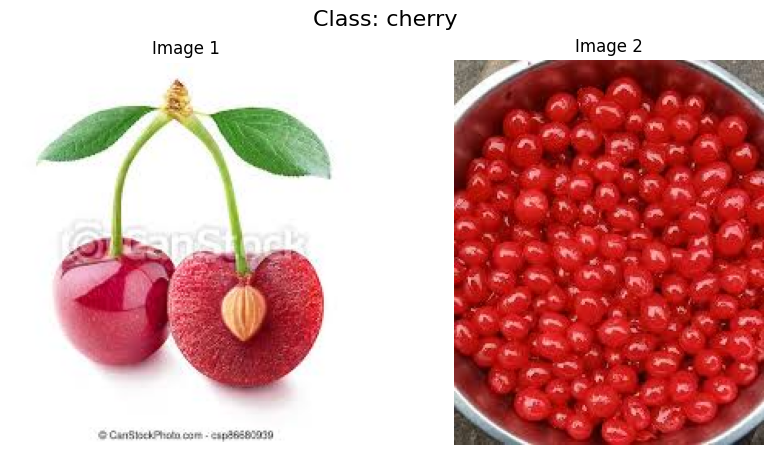

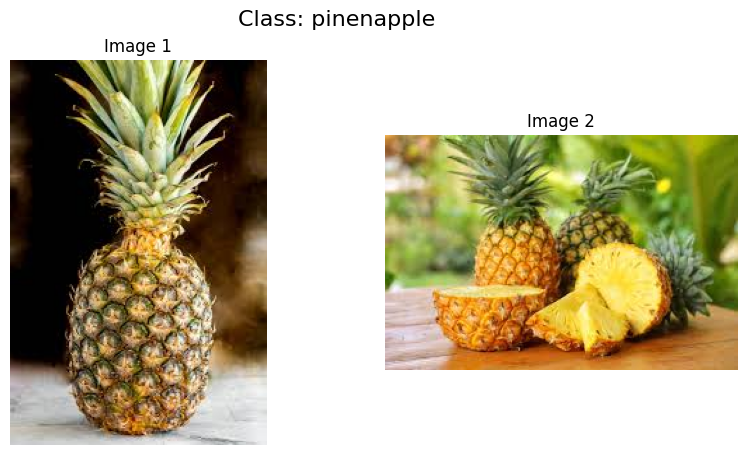

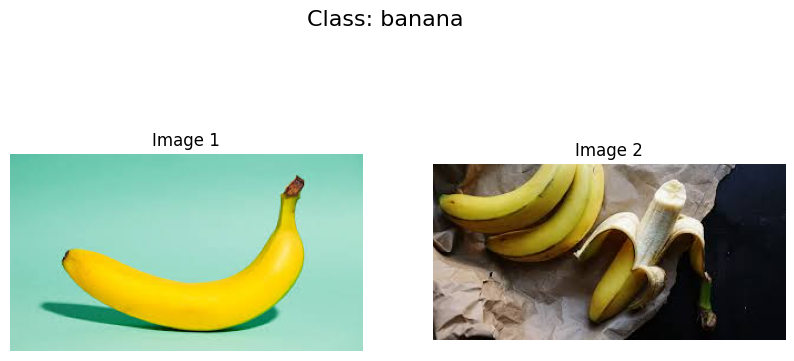

In [30]:
# Assuming 'test_dir' is the path to your test data directory
for class_name in os.listdir(test_dir):
    class_dir = os.path.join(test_dir, class_name)
    image_files = os.listdir(class_dir)

    # Filter for valid image files
    image_files = [f for f in image_files if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Skip the directory if no image files are found
    if not image_files:
        print(f"Skipping directory '{class_name}' as it contains no valid image files.")
        continue

    # Create a subsection for the current class
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(f"Class: {class_name}", fontsize=16)

    # Display 2 random images for the class
    images_to_display = min(2, len(image_files)) # Display at most 2 images
    for i in range(images_to_display):
        # Get a random image index
        random_index = random.randint(0, len(image_files) - 1)
        image_path = os.path.join(class_dir, image_files.pop(random_index)) # Use pop to remove selected image

        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        axes[i].imshow(image)
        axes[i].set_title(f"Image {i + 1}")
        axes[i].axis("off")

    # If less than 2 images were found/displayed in the class
    for i in range(images_to_display, 2):
        axes[i].set_title("Not enough valid images found")
        axes[i].axis("off")

    plt.show()

## Data Preprocessing

- Parameters Definition
- Rescale(Normalise)
- Train - val split
- Data Augmentation

**Parameters Definition**

In [31]:
# Desired image height and width
img_shape = (img_height, img_width,3)
batch_size = 36   # Number of images per batch
validation_split = 0.2  # 20% data for validation train testing
epoches= 50 #50 rounds of testing for improvement in model performance

**Rescaling**

In [32]:
# Create a preprocessing layer for normalization
rescale = tf.keras.layers.Rescaling(1./255)  # Normalize pixel values to [0, 1]

**Data Augmentation**

- Flip Horizontal
- Random Zoom

In [33]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomZoom(0.1),
])

**Train Val Test dataset**

In [34]:
# rescale = tf.keras.layers.Rescaling(1./255)  # Normalize pixel values to [0, 1]

# Create training dataset with normalization
train_ds, val_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,  # Replace with the actual path to your training data directory
    image_size=(img_height, img_width),
    batch_size=batch_size,
    validation_split=validation_split,
    subset='both',
    seed=123
)

# # Apply the normalization (Rescaling) to the validation dataset
val_ds = val_ds.map(lambda x, y: (rescale(x), y))
train_ds = train_ds.map(lambda x, y: (rescale(x), y))


# Create validation dataset with normalization
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,  # Replace with the actual path to your training data directory
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False,
    seed=123
)

# Apply the normalization (Rescaling) to the validation dataset
test_ds = test_ds.map(lambda x, y: (rescale(x), y))

Found 2301 files belonging to 10 classes.
Using 1841 files for training.
Using 460 files for validation.
Found 1025 files belonging to 10 classes.


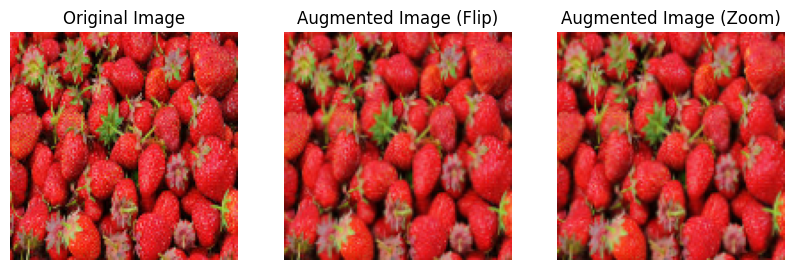

In [35]:

# Take a random image from the training dataset
for images, labels in train_ds.take(1):
    random_image = images[0] # Get the first image in the batch
    random_label = labels[0]

# Apply data augmentation (flip)

augmented_flip = data_augmentation(tf.expand_dims(random_image, 0), training=True)

# Apply data augmentation (zoom) - Need to create a separate sequential for zoom
data_augmentation_zoom = tf.keras.Sequential([
    layers.RandomZoom(0.1),
])

augmented_zoom = data_augmentation_zoom(tf.expand_dims(random_image, 0), training=True)


# Visualize the original and augmented images
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(random_image.numpy())
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(augmented_flip[0].numpy())
plt.title("Augmented Image (Flip)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(augmented_zoom[0].numpy())
plt.title("Augmented Image (Zoom)")
plt.axis("off")

plt.show()

# CNN Scratch Models

## CNN base

CNN Basic Architecture
- Filters: 32, (3x3)
- Activation ReLu
- Max Pooling: (2,2)
- Stride: Pooling(2), Filter(1)
- FCN
 - Activation: ReLu
 - Output: 10 classes, Softmax

In [36]:
# Sequential Keras CNN Model

cnn_model = keras.Sequential([

    # First Convulation Layer
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=img_shape),
    layers.MaxPooling2D((2, 2),strides=2),

    # Second Convulation Layer
    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2),strides=2),

    # Third Convulation Layer
    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2),strides=2),

    layers.Flatten(), # flatten the output into 1D layer

    #FCN hidden Layer
    layers.Dense(32, activation='relu'),
    layers.Dense(64, activation='relu'),

    # Output Layer with 10 classes
    layers.Dense(10, activation='softmax')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [37]:
cnn_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │       200,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 222,890 (870.66 KB)

 Trainable params: 222,890 (870.66 KB)

 Non-trainable params: 0 (0.00 B)

### Optimisers Comparision

**Adam**

In [38]:
cnn_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [39]:
# Define the callbacks
callbackadam = [
    # Save the best model based on validation accuracy
    ModelCheckpoint(
        'best_model_adam_cnn.h5',  # Path to save the best model
        save_best_only=True,  # Save only the best model
        monitor='val_loss',  # Monitor validation loss
        mode='min',  # Minimize the validation loss
        verbose=1
    ),
    # Stop training if validation loss doesn't improve for 5 epochs
    EarlyStopping(
        monitor='val_accuracy',  # Monitor validation loss
        patience=5,  # Wait for 5 epochs before stopping
        restore_best_weights=True,  # Restore best weights after stopping
        verbose=1
    )
]

In [40]:
# Time the training process for the basic CNN model
start_time = time.time()
history1 = cnn_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epoches,
    batch_size=batch_size,
    callbacks=callbackadam
)
end_time = time.time()
training_time_adam = end_time - start_time
print(f"Training time for basic CNN model: {training_time_adam:.2f} seconds")

Epoch 1/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.1092 - loss: 2.3063
Epoch 1: val_loss improved from inf to 2.22936, saving model to best_model_adam_cnn.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - accuracy: 0.1098 - loss: 2.3059 - val_accuracy: 0.1957 - val_loss: 2.2294
Epoch 2/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.2121 - loss: 2.0775
Epoch 2: val_loss improved from 2.22936 to 1.82874, saving model to best_model_adam_cnn.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 0.2127 - loss: 2.0754 - val_accuracy: 0.2696 - val_loss: 1.8287
Epoch 3/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.3229 - loss: 1.7685
Epoch 3: val_loss improved from 1.82874 to 1.61487, saving model to best_model_adam_cnn.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.3234 - loss: 1.7659 - val_accuracy: 0.3565 - val_loss: 1.6149
Epoch 4/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.4138 - loss: 1.5390
Epoch 4: val_loss improved from 1.61487 to 1.57001, saving model to best_model_adam_cnn.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.4146 - loss: 1.5367 - val_accuracy: 0.3783 - val_loss: 1.5700
Epoch 5/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.4460 - loss: 1.4563
Epoch 5: val_loss did not improve from 1.57001
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4470 - loss: 1.4527 - val_accuracy: 0.3870 - val_loss: 1.5709
Epoch 6/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.4836 - loss: 1.3747
Epoch 6: val_loss improved from 1.57001 to 1.49841, saving model to best_model_adam_cnn.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4840 - loss: 1.3737 - val_accuracy: 0.4239 - val_loss: 1.4984
Epoch 7/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.5218 - loss: 1.2768
Epoch 7: val_loss improved from 1.49841 to 1.49352, saving model to best_model_adam_cnn.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5222 - loss: 1.2759 - val_accuracy: 0.4261 - val_loss: 1.4935
Epoch 8/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.5294 - loss: 1.2860
Epoch 8: val_loss improved from 1.49352 to 1.37697, saving model to best_model_adam_cnn.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.5318 - loss: 1.2792 - val_accuracy: 0.4587 - val_loss: 1.3770
Epoch 9/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6192 - loss: 1.0739
Epoch 9: val_loss improved from 1.37697 to 1.34672, saving model to best_model_adam_cnn.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - accuracy: 0.6192 - loss: 1.0729 - val_accuracy: 0.4891 - val_loss: 1.3467
Epoch 10/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.6272 - loss: 1.0304
Epoch 10: val_loss improved from 1.34672 to 1.34366, saving model to best_model_adam_cnn.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - accuracy: 0.6290 - loss: 1.0257 - val_accuracy: 0.5174 - val_loss: 1.3437
Epoch 11/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.6523 - loss: 0.9153
Epoch 11: val_loss did not improve from 1.34366
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - accuracy: 0.6534 - loss: 0.9136 - val_accuracy: 0.5000 - val_loss: 1.4031
Epoch 12/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.7125 - loss: 0.8432
Epoch 12: val_loss did not improve from 1.34366
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.7143 - loss: 0.8371 - val_accuracy: 0.5130 - val_loss: 1.4523
Epoch 13/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.7321 - loss: 0.7168
Epoch 13: val_loss did not improve from 1.34366
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.7334 - loss: 0.7156 - val_accuracy: 0.5000 - val_loss: 1.4348
Epoch 14/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.7717 - loss: 0.6274
Epoch 14: val_loss did not improve from 1.34366


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step


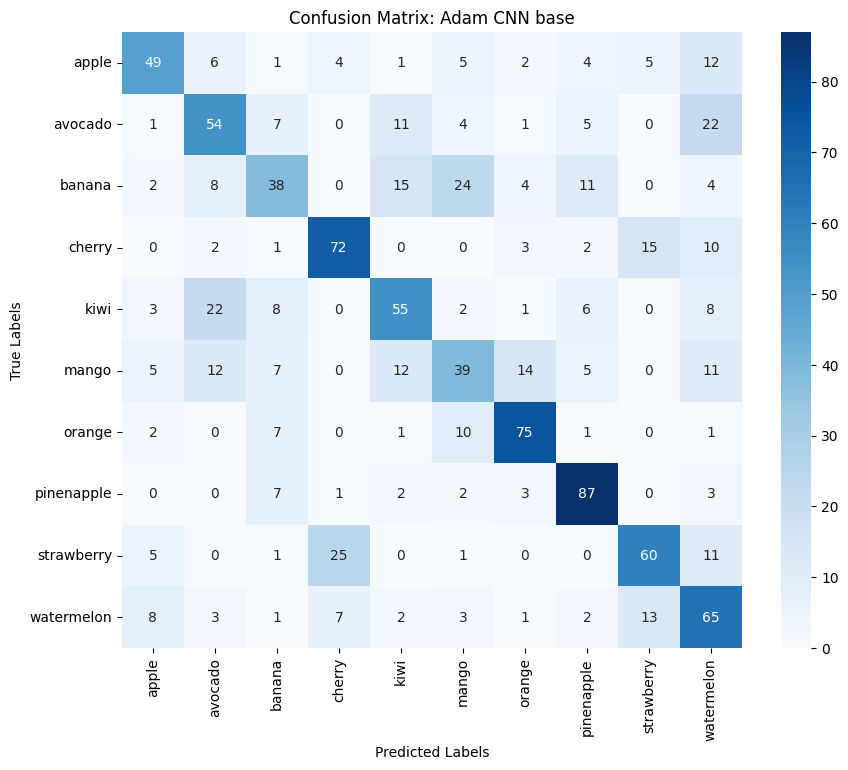

In [41]:

predictions1 = cnn_model.predict(test_ds)
predicted_classes1 = np.argmax(predictions1, axis=1)
true_classes1 = np.concatenate([y for x, y in test_ds], axis=0)

cm = confusion_matrix(true_classes1, predicted_classes1)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix: Adam CNN base")
plt.show()

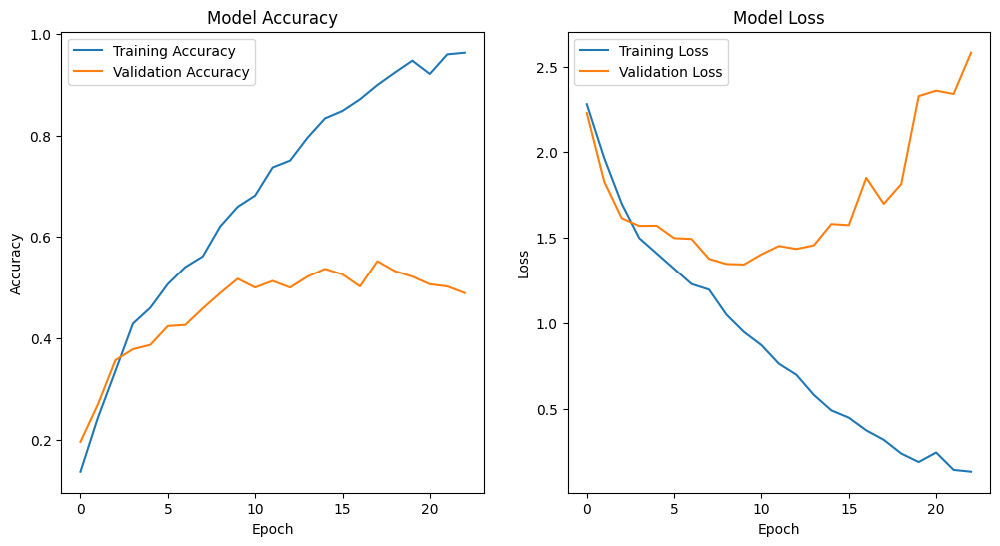

In [42]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'], label='Training Accuracy')
plt.plot(history1.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'], label='Training Loss')
plt.plot(history1.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [43]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = cnn_model.evaluate(test_ds)
test_acc_adam = test_accuracy
print(f"\n\nTest Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.5410 - loss: 2.0341


Test Loss: 1.7283, Test Accuracy: 0.5795


In [44]:
print(classification_report(true_classes1, predicted_classes1))

              precision    recall  f1-score   support

           0       0.65      0.55      0.60        89
           1       0.50      0.51      0.51       105
           2       0.49      0.36      0.41       106
           3       0.66      0.69      0.67       105
           4       0.56      0.52      0.54       105
           5       0.43      0.37      0.40       105
           6       0.72      0.77      0.75        97
           7       0.71      0.83      0.76       105
           8       0.65      0.58      0.61       103
           9       0.44      0.62      0.52       105

    accuracy                           0.58      1025
   macro avg       0.58      0.58      0.58      1025
weighted avg       0.58      0.58      0.58      1025



**SGD**

In [45]:
from tensorflow.keras.optimizers import SGD

cnn_model.compile(
    optimizer=SGD(learning_rate=0.001, momentum=0.9),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Define the callbacks
callbacksdg = [
    # Save the best model based on validation accuracy
    ModelCheckpoint(
        'best_model_sdg_cnn.h5',  # Path to save the best model
        save_best_only=True,  # Save only the best model
        monitor='val_loss',  # Monitor validation loss
        mode='min',  # Minimize the validation loss
        verbose=1
    ),
    # Stop training if validation loss doesn't improve for 5 epochs
    EarlyStopping(
        monitor='val_accuracy',  # Monitor validation loss
        patience=5,  # Wait for 5 epochs before stopping
        restore_best_weights=True,  # Restore best weights after stopping
        verbose=1
    )
]

# Time the training process for the basic CNN model
start_time = time.time()
history2 = cnn_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epoches,
    batch_size=batch_size,
    callbacks=callbacksdg
)
end_time = time.time()
training_time_sgd = end_time - start_time
print(f"Training time for basic CNN model: {training_time_sgd:.2f} seconds")



Epoch 1/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.9363 - loss: 0.2246
Epoch 1: val_loss improved from inf to 1.92167, saving model to best_model_sdg_cnn.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9363 - loss: 0.2245 - val_accuracy: 0.5217 - val_loss: 1.9217
Epoch 2/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.9113 - loss: 0.2616
Epoch 2: val_loss did not improve from 1.92167
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.9119 - loss: 0.2603 - val_accuracy: 0.5239 - val_loss: 1.9583
Epoch 3/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.9515 - loss: 0.1788
Epoch 3: val_loss did not improve from 1.92167
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.9514 - loss: 0.1788 - val_accuracy: 0.5022 - val_loss: 2.1389
Epoch 4/50
48/52 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.9255 - loss: 0.2268
Epoch 4: val_loss did not improve from 1.92167
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.9255 - loss: 0.2269 - val_accuracy: 0.5152 - val_loss: 2.0712
Epoch 5/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.9402 - loss: 0.2002
Epoch 5: val_loss did not improve from 1.92167
52/52 ━━

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step


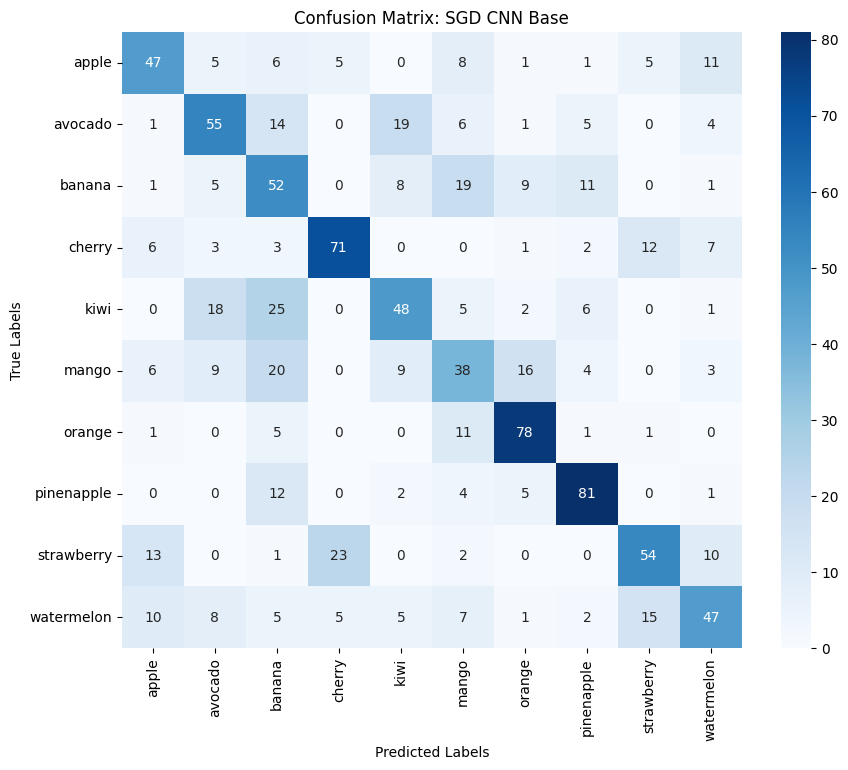

In [46]:
predictions2 = cnn_model.predict(test_ds)
predicted_classes2 = np.argmax(predictions2, axis=1)
true_classes2 = np.concatenate([y for x, y in test_ds], axis=0)

cm = confusion_matrix(true_classes2, predicted_classes2)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix: SGD CNN Base")
plt.show()

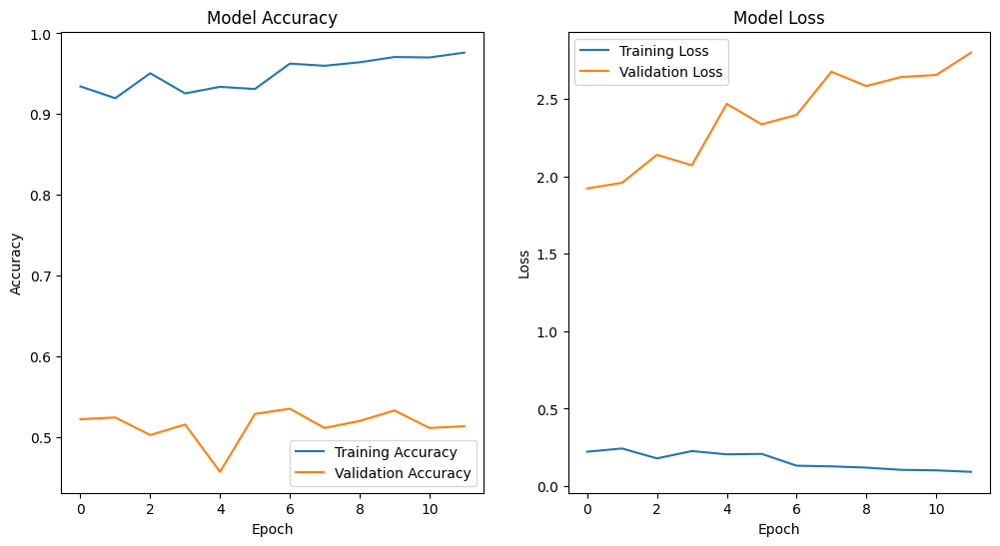

In [47]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history2.history['accuracy'], label='Training Accuracy')
plt.plot(history2.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [48]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = cnn_model.evaluate(test_ds)
test_acc_sgd= test_accuracy
print(f"\n\nTest Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.5452 - loss: 2.3570


Test Loss: 2.4019, Test Accuracy: 0.5571


In [49]:
# Generate the classification report
print(classification_report(true_classes2, predicted_classes2))

              precision    recall  f1-score   support

           0       0.55      0.53      0.54        89
           1       0.53      0.52      0.53       105
           2       0.36      0.49      0.42       106
           3       0.68      0.68      0.68       105
           4       0.53      0.46      0.49       105
           5       0.38      0.36      0.37       105
           6       0.68      0.80      0.74        97
           7       0.72      0.77      0.74       105
           8       0.62      0.52      0.57       103
           9       0.55      0.45      0.49       105

    accuracy                           0.56      1025
   macro avg       0.56      0.56      0.56      1025
weighted avg       0.56      0.56      0.56      1025



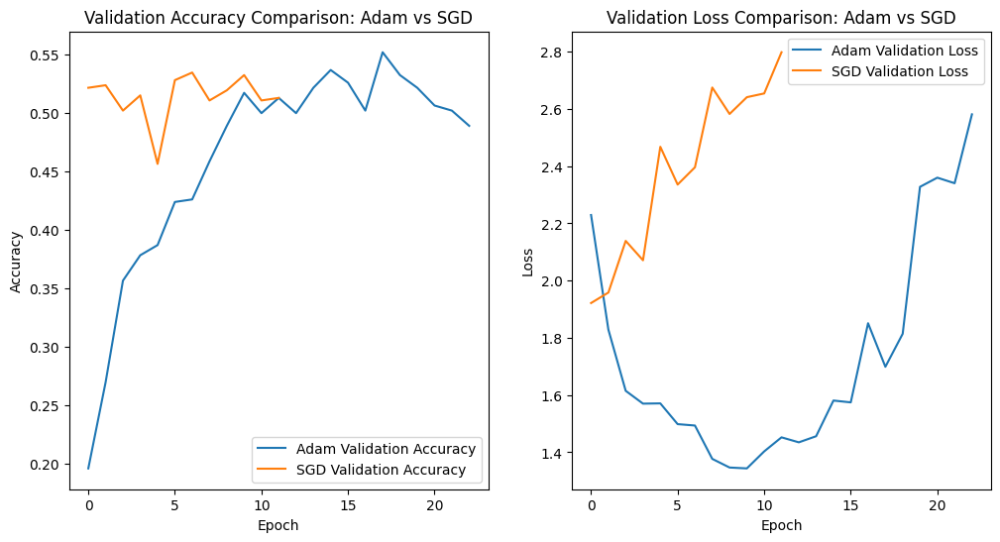

In [50]:
# Compare accuracy and loss curves between SGD and Adam models
plt.figure(figsize=(12, 6))

# Accuracy comparison
plt.subplot(1, 2, 1)
plt.plot(history1.history['val_accuracy'], label='Adam Validation Accuracy')
plt.plot(history2.history['val_accuracy'], label='SGD Validation Accuracy')
plt.title('Validation Accuracy Comparison: Adam vs SGD')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss comparison
plt.subplot(1, 2, 2)
plt.plot(history1.history['val_loss'], label='Adam Validation Loss')
plt.plot(history2.history['val_loss'], label='SGD Validation Loss')
plt.title('Validation Loss Comparison: Adam vs SGD')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

## CNN Deeper

- Data Augmentation
- More layers
- Regularisation
 - Batch Normalisation
 - Dropout

In [51]:
train_ds

<_MapDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [52]:
cnn_deeper = keras.Sequential([

    keras.Input(shape=(128, 128, 3)),  # Define input shape

    # Data Augmentation
    data_augmentation,

    # --- First Conv Block ---
    layers.Conv2D(16, (3, 3), padding="same",activation="relu"),
    layers.MaxPooling2D((2, 2)),

    # --- Second Conv Block ---
    layers.Conv2D(32, (3, 3), padding="same"),
    layers.MaxPooling2D((2, 2)),

    # --- Third Conv Block ---
    layers.Conv2D(64, (3, 3), padding="same"),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # --- Fourth Conv Block ---
    layers.Conv2D(128, (3, 3), padding="same"),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),

    # Flatten before Dense
    layers.Flatten(),

    # Dense Layer 1
    layers.Dense(64),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.Dropout(0.5),

    # Dense Layer 2
    layers.Dense(32),
    layers.Activation('relu'),


    # Output Layer (10 classes)
    layers.Dense(10, activation='softmax')
])


In [53]:
cnn_deeper.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [54]:
cnn_deeper.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 128, 128, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │       524,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │           330 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 624,458 (2.38 MB)

 Trainable params: 624,330 (2.38 MB)

 Non-trainable params: 128 (512.00 B)

In [55]:
# Define the callbacks
callbackD = [
    # Save the best model based on validation accuracy
    ModelCheckpoint(
        'best_model_deeper.h5',  # Path to save the best model
        save_best_only=True,  # Save only the best model
        monitor='val_loss',  # Monitor validation loss
        mode='min',  # Minimize the validation loss
        verbose=1
    ),
    # Stop training if validation loss doesn't improve for 5 epochs
    EarlyStopping(
        monitor='val_accuracy',  # Monitor validation loss
        patience=5,  # Wait for 5 epochs before stopping
        restore_best_weights=True,  # Restore best weights after stopping
        verbose=1
    )
]

In [56]:
# Time the training process for the deeper CNN model
start_time = time.time()
history_deeper = cnn_deeper.fit(
    train_ds,
    validation_data=val_ds,
    batch_size=batch_size,
    epochs=epoches,
    callbacks=callbackD
)
end_time = time.time()
training_time_deeper = end_time - start_time
print(f"Training time for deeper CNN model: {training_time_deeper:.2f} seconds")

Epoch 1/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.1790 - loss: 2.3290
Epoch 1: val_loss improved from inf to 2.03744, saving model to best_model_deeper.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - accuracy: 0.1797 - loss: 2.3261 - val_accuracy: 0.2413 - val_loss: 2.0374
Epoch 2/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.3466 - loss: 1.8418
Epoch 2: val_loss improved from 2.03744 to 1.80596, saving model to best_model_deeper.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.3467 - loss: 1.8411 - val_accuracy: 0.3348 - val_loss: 1.8060
Epoch 3/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.4056 - loss: 1.6448
Epoch 3: val_loss improved from 1.80596 to 1.58723, saving model to best_model_deeper.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.4065 - loss: 1.6422 - val_accuracy: 0.4283 - val_loss: 1.5872
Epoch 4/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.4707 - loss: 1.4820
Epoch 4: val_loss improved from 1.58723 to 1.44534, saving model to best_model_deeper.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.4709 - loss: 1.4813 - val_accuracy: 0.4826 - val_loss: 1.4453
Epoch 5/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.4936 - loss: 1.4224
Epoch 5: val_loss improved from 1.44534 to 1.43263, saving model to best_model_deeper.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.4940 - loss: 1.4213 - val_accuracy: 0.4826 - val_loss: 1.4326
Epoch 6/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5197 - loss: 1.3402
Epoch 6: val_loss improved from 1.43263 to 1.38266, saving model to best_model_deeper.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.5197 - loss: 1.3400 - val_accuracy: 0.4870 - val_loss: 1.3827
Epoch 7/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.5557 - loss: 1.2991
Epoch 7: val_loss improved from 1.38266 to 1.22528, saving model to best_model_deeper.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - accuracy: 0.5555 - loss: 1.2975 - val_accuracy: 0.5804 - val_loss: 1.2253
Epoch 8/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5443 - loss: 1.2884
Epoch 8: val_loss improved from 1.22528 to 1.11364, saving model to best_model_deeper.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.5452 - loss: 1.2853 - val_accuracy: 0.6109 - val_loss: 1.1136
Epoch 9/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5527 - loss: 1.1991
Epoch 9: val_loss did not improve from 1.11364
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.5524 - loss: 1.2001 - val_accuracy: 0.5391 - val_loss: 1.3766
Epoch 10/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.5520 - loss: 1.2291
Epoch 10: val_loss did not improve from 1.11364
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.5525 - loss: 1.2276 - val_accuracy: 0.6022 - val_loss: 1.1462
Epoch 11/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.6174 - loss: 1.0633
Epoch 11: val_loss did not improve from 1.11364
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.6172 - loss: 1.0635 - val_accuracy: 0.5696 - val_loss: 1.1743
Epoch 12/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.6287 - loss: 1.0756
Epoch 12: val_loss did not improve from 1.11364
52

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step


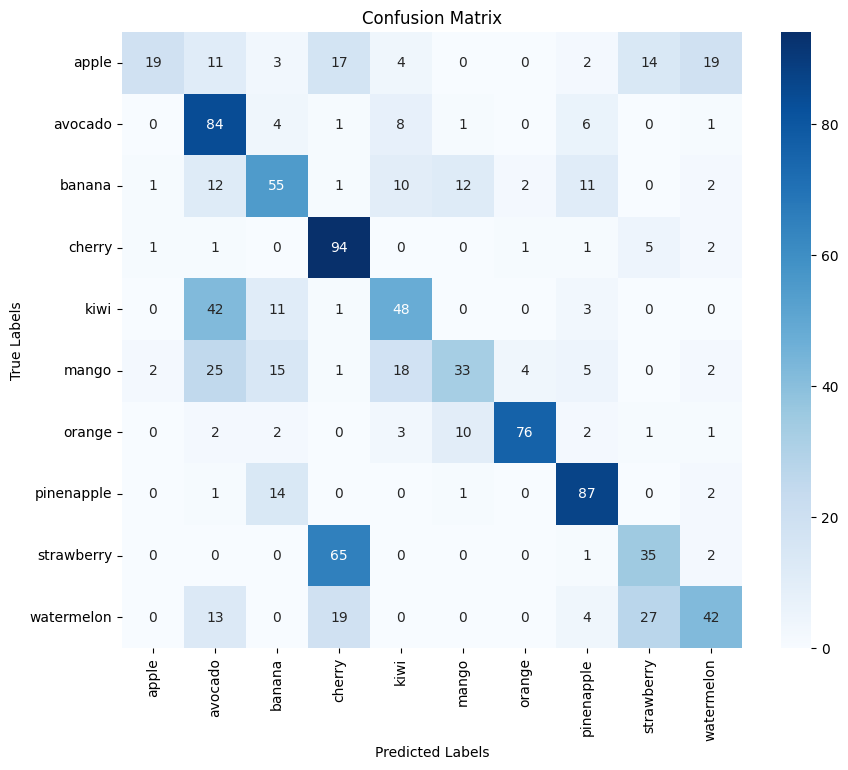

In [57]:
predictionsD = cnn_deeper.predict(test_ds)
predicted_classD = np.argmax(predictionsD, axis=1)
true_classesD = np.concatenate([y for x, y in test_ds], axis=0)

cm = confusion_matrix(true_classesD, predicted_classD)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

In [58]:
predicted_class_counts = Counter(predicted_classD)

for class_index, count in predicted_class_counts.items():
    class_name = classes[class_index]  # Get the class name from the 'classes' list
    print(f"{count} {class_name} predicted.")


23 apple predicted.
82 strawberry predicted.
73 watermelon predicted.
191 avocado predicted.
199 cherry predicted.
91 kiwi predicted.
122 pinenapple predicted.
104 banana predicted.
57 mango predicted.
83 orange predicted.


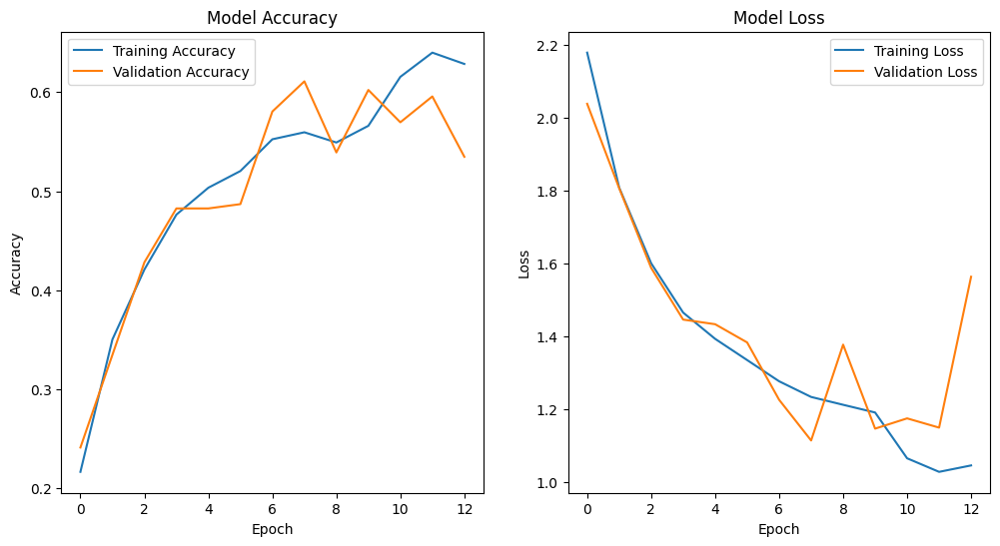

In [59]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history_deeper.history['accuracy'], label='Training Accuracy')
plt.plot(history_deeper.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(history_deeper.history['loss'], label='Training Loss')
plt.plot(history_deeper.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [60]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = cnn_deeper.evaluate(test_ds)
test_acc_deeper = test_accuracy
print(f"\n\nTest Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.5339 - loss: 1.4674


Test Loss: 1.3366, Test Accuracy: 0.5590


In [61]:
# Generate the classification report
print(classification_report(true_classesD, predicted_classD))

              precision    recall  f1-score   support

           0       0.83      0.21      0.34        89
           1       0.44      0.80      0.57       105
           2       0.53      0.52      0.52       106
           3       0.47      0.90      0.62       105
           4       0.53      0.46      0.49       105
           5       0.58      0.31      0.41       105
           6       0.92      0.78      0.84        97
           7       0.71      0.83      0.77       105
           8       0.43      0.34      0.38       103
           9       0.58      0.40      0.47       105

    accuracy                           0.56      1025
   macro avg       0.60      0.56      0.54      1025
weighted avg       0.59      0.56      0.54      1025



## deeper with issue

Epoch 1/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.1004 - loss: 2.7861
Epoch 1: val_loss improved from inf to 2.31477, saving model to best_model_deeper_bad.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - accuracy: 0.1004 - loss: 2.7862 - val_accuracy: 0.1196 - val_loss: 2.3148
Epoch 2/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.1204 - loss: 2.6251
Epoch 2: val_loss improved from 2.31477 to 2.30006, saving model to best_model_deeper_bad.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - accuracy: 0.1198 - loss: 2.6261 - val_accuracy: 0.1174 - val_loss: 2.3001
Epoch 3/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.1239 - loss: 2.5582
Epoch 3: val_loss improved from 2.30006 to 2.26378, saving model to best_model_deeper_bad.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.1239 - loss: 2.5577 - val_accuracy: 0.1500 - val_loss: 2.2638
Epoch 4/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.1259 - loss: 2.4735
Epoch 4: val_loss improved from 2.26378 to 2.24795, saving model to best_model_deeper_bad.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.1260 - loss: 2.4724 - val_accuracy: 0.1717 - val_loss: 2.2480
Epoch 5/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.1672 - loss: 2.3034
Epoch 5: val_loss improved from 2.24795 to 2.18740, saving model to best_model_deeper_bad.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.1671 - loss: 2.3034 - val_accuracy: 0.2152 - val_loss: 2.1874
Epoch 6/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.1883 - loss: 2.2494
Epoch 6: val_loss improved from 2.18740 to 2.08148, saving model to best_model_deeper_bad.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.1878 - loss: 2.2485 - val_accuracy: 0.2543 - val_loss: 2.0815
Epoch 7/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.2045 - loss: 2.1523
Epoch 7: val_loss improved from 2.08148 to 1.85025, saving model to best_model_deeper_bad.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - accuracy: 0.2045 - loss: 2.1515 - val_accuracy: 0.2957 - val_loss: 1.8502
Epoch 8/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.2373 - loss: 2.0760
Epoch 8: val_loss improved from 1.85025 to 1.78941, saving model to best_model_deeper_bad.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.2376 - loss: 2.0750 - val_accuracy: 0.3848 - val_loss: 1.7894
Epoch 9/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.2757 - loss: 2.0082
Epoch 9: val_loss improved from 1.78941 to 1.76590, saving model to best_model_deeper_bad.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.2755 - loss: 2.0081 - val_accuracy: 0.3870 - val_loss: 1.7659
Epoch 10/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.2679 - loss: 1.9431
Epoch 10: val_loss did not improve from 1.76590
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.2678 - loss: 1.9425 - val_accuracy: 0.3022 - val_loss: 1.8282
Epoch 11/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.2727 - loss: 1.8978
Epoch 11: val_loss did not improve from 1.76590
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 0.2728 - loss: 1.8974 - val_accuracy: 0.2478 - val_loss: 1.9921
Epoch 12/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.2903 - loss: 1.8678
Epoch 12: val_loss did not improve from 1.76590
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.2897 - loss: 1.8683 - val_accuracy: 0.2935 - val_loss: 1.8532
Epoch 13/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.2839 - loss: 1.8471
Epoch 13: val_loss did not improve from 1.76590


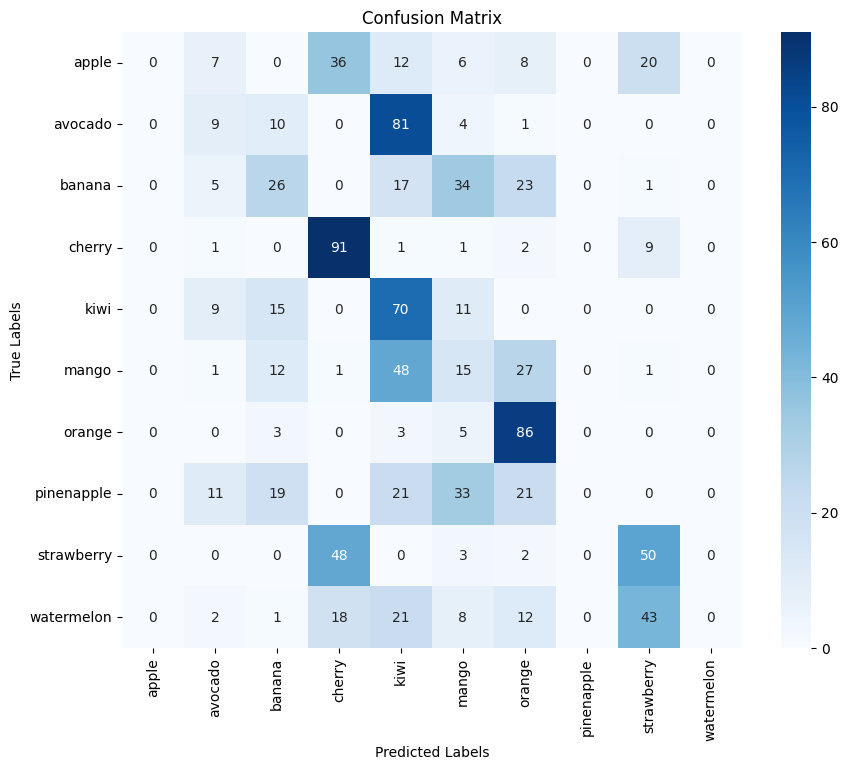

In [62]:
from tensorflow.keras.layers import Rescaling


cnn_deeper = keras.Sequential([

    keras.Input(shape=(128, 128, 3)),  # Define input shape

    # Data Augmentation
    data_augmentation,


    # --- First Conv Block ---
    layers.Conv2D(16, (3, 3), padding="same",activation="relu"),
    layers.MaxPooling2D((2, 2)),

    # --- Second Conv Block ---
    layers.Conv2D(32, (3, 3), padding="same"),
    layers.MaxPooling2D((2, 2)),

    # --- Third Conv Block ---
    layers.Conv2D(64, (3, 3), padding="same"),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    # --- Fourth Conv Block ---
    layers.Conv2D(128, (3, 3), padding="same"),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    # --- Fifth Conv Block ---
    layers.Conv2D(128, (3, 3), padding="same"),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    # --- Sixth Conv Block ---
    layers.Conv2D(256, (3, 3), padding="same"),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.8),

    # Flatten before Dense
    layers.Flatten(),

    # Dense Layer 1
    layers.Dense(64),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.Dropout(0.5),

    # Dense Layer 2
    layers.Dense(32),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.Dropout(0.5),

    # Output Layer (10 classes)
    layers.Dense(10, activation='softmax')
])

cnn_deeper.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Define the callbacks
callbackd = [
    # Save the best model based on validation accuracy
    ModelCheckpoint(
        'best_model_deeper_bad.h5',  # Path to save the best model
        save_best_only=True,  # Save only the best model
        monitor='val_loss',  # Monitor validation loss
        mode='min',  # Minimize the validation loss
        verbose=1
    ),
    # Stop training if validation loss doesn't improve for 5 epochs
    EarlyStopping(
        monitor='val_accuracy',  # Monitor validation loss
        patience=5,  # Wait for 5 epochs before stopping
        restore_best_weights=True,  # Restore best weights after stopping
        verbose=1
    )
]


# Time the training process for the deeper CNN model
start_time = time.time()
history_ddeeper = cnn_deeper.fit(
    train_ds,
    validation_data=val_ds,
    batch_size=batch_size,
    epochs=epoches,
    callbacks=callbackd
)
end_time = time.time()
training_time_baddeeper = end_time - start_time
print(f"Training time for deeper CNN model: {training_time_baddeeper:.2f} seconds")

predictions = cnn_deeper.predict(test_ds)
predicted_class = np.argmax(predictions, axis=1)
true_classes = np.concatenate([y for x, y in test_ds], axis=0)

cm = confusion_matrix(true_classes, predicted_class)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

In [63]:
print(classification_report(predicted_class,true_classes))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.09      0.20      0.12        45
           2       0.25      0.30      0.27        86
           3       0.87      0.47      0.61       194
           4       0.67      0.26      0.37       274
           5       0.14      0.12      0.13       120
           6       0.89      0.47      0.62       182
           7       0.00      0.00      0.00         0
           8       0.49      0.40      0.44       124
           9       0.00      0.00      0.00         0

    accuracy                           0.34      1025
   macro avg       0.34      0.22      0.26      1025
weighted avg       0.60      0.34      0.42      1025



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [64]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = cnn_deeper.evaluate(test_ds)
test_acc_bad_deeper = test_accuracy
print(f"\n\nTest Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.2688 - loss: 1.8960


Test Loss: 1.8092, Test Accuracy: 0.3385


# Part B: Fine-Tuning a Pre-Trained Model (Transfer Learning).

## Loading and Adapting a Pre - Trained Model (MobileVNet2)

In [65]:
# Load the base model with pretrained weights from ImageNet
base_model = MobileNetV2(input_shape=img_shape, include_top=False, weights='imagenet',pooling='avg')
base_model.trainable = False  # Freeze base model


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [66]:
# Build the model
transfer_model = Sequential()

# Add the pre-trained Xception base
transfer_model.add(base_model)

# Batch Normalization
# transfer_model.add(layers.BatchNormalization())

# Dropout Layer
transfer_model.add(Dropout(0.35))

# Add a dense layer with 120 units and ReLU activation function
transfer_model.add(Dense(220, activation='relu'))

# Add a dense layer with 120 units and ReLU activation function
transfer_model.add(Dense(60, activation='relu'))

# Add a Flatten layer to convert the output to 2D
transfer_model.add(layers.Flatten())  # Add this line

# Add the output layer with 1 unit and sigmoid activation function for binary classification
transfer_model.add(Dense(10, activation='softmax'))

In [67]:
transfer_model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128            │ (None, 1280)           │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 220)            │       281,820 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 60)             │        13,260 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 60)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 10)             │           610 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,553,674 (9.74 MB)

 Trainable params: 295,690 (1.13 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [68]:
# Compile model
base_learning_rate = 0.0001
transfer_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
# transfer_model.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9),
 loss='sparse_categorical_crossentropy', metrics=['accuracy']) # Changed to sparse_categorical_crossentropy

In [69]:
# Define the callbacks
callbacktransfer = [
    # Save the best model based on validation accuracy
    ModelCheckpoint(
        'best_model_transfer.h5',  # Path to save the best model
        save_best_only=True,  # Save only the best model
        monitor='val_loss',  # Monitor validation loss
        mode='min',  # Minimize the validation loss
        verbose=1
    ),
    # Stop training if validation loss doesn't improve for 5 epochs
    EarlyStopping(
        monitor='val_accuracy',  # Monitor validation loss
        patience=10,  # Wait for 10 epochs before stopping
        restore_best_weights=True,  # Restore best weights after stopping
        verbose=1
    )
]

In [70]:
# Time the training process for the deeper CNN model
start_time = time.time()
history_transfer = transfer_model.fit(
    train_ds,
    validation_data=val_ds,
    batch_size=batch_size,
    epochs=epoches,
    callbacks=callbacktransfer
)
end_time = time.time()
training_time_transfer = end_time - start_time
print(f"Training time for deeper CNN model: {training_time_transfer:.2f} seconds")

Epoch 1/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.1540 - loss: 2.4004
Epoch 1: val_loss improved from inf to 1.76392, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 26s 314ms/step - accuracy: 0.1552 - loss: 2.3968 - val_accuracy: 0.4826 - val_loss: 1.7639
Epoch 2/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.4532 - loss: 1.7254
Epoch 2: val_loss improved from 1.76392 to 1.27020, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.4581 - loss: 1.7157 - val_accuracy: 0.6804 - val_loss: 1.2702
Epoch 3/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.6485 - loss: 1.2529
Epoch 3: val_loss improved from 1.27020 to 0.91116, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - accuracy: 0.6507 - loss: 1.2460 - val_accuracy: 0.7391 - val_loss: 0.9112
Epoch 4/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.7346 - loss: 0.9296
Epoch 4: val_loss improved from 0.91116 to 0.71256, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step - accuracy: 0.7358 - loss: 0.9257 - val_accuracy: 0.7826 - val_loss: 0.7126
Epoch 5/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.7988 - loss: 0.6897
Epoch 5: val_loss improved from 0.71256 to 0.59291, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - accuracy: 0.7989 - loss: 0.6880 - val_accuracy: 0.8130 - val_loss: 0.5929
Epoch 6/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8295 - loss: 0.5921
Epoch 6: val_loss improved from 0.59291 to 0.52689, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.8302 - loss: 0.5889 - val_accuracy: 0.8304 - val_loss: 0.5269
Epoch 7/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.8538 - loss: 0.4595
Epoch 7: val_loss improved from 0.52689 to 0.47531, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.8542 - loss: 0.4592 - val_accuracy: 0.8522 - val_loss: 0.4753
Epoch 8/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8767 - loss: 0.4304
Epoch 8: val_loss improved from 0.47531 to 0.43478, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - accuracy: 0.8768 - loss: 0.4297 - val_accuracy: 0.8543 - val_loss: 0.4348
Epoch 9/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.8780 - loss: 0.3945
Epoch 9: val_loss improved from 0.43478 to 0.41260, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8784 - loss: 0.3933 - val_accuracy: 0.8630 - val_loss: 0.4126
Epoch 10/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8934 - loss: 0.3372
Epoch 10: val_loss improved from 0.41260 to 0.38932, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - accuracy: 0.8937 - loss: 0.3370 - val_accuracy: 0.8761 - val_loss: 0.3893
Epoch 11/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9182 - loss: 0.2922
Epoch 11: val_loss improved from 0.38932 to 0.37647, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.9180 - loss: 0.2917 - val_accuracy: 0.8826 - val_loss: 0.3765
Epoch 12/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9131 - loss: 0.2776
Epoch 12: val_loss improved from 0.37647 to 0.35519, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.9134 - loss: 0.2772 - val_accuracy: 0.8848 - val_loss: 0.3552
Epoch 13/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.9352 - loss: 0.2442
Epoch 13: val_loss improved from 0.35519 to 0.34846, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.9350 - loss: 0.2440 - val_accuracy: 0.8783 - val_loss: 0.3485
Epoch 14/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9293 - loss: 0.2390
Epoch 14: val_loss improved from 0.34846 to 0.34496, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.9295 - loss: 0.2384 - val_accuracy: 0.8891 - val_loss: 0.3450
Epoch 15/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.9336 - loss: 0.2223
Epoch 15: val_loss improved from 0.34496 to 0.34047, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.9336 - loss: 0.2221 - val_accuracy: 0.8913 - val_loss: 0.3405
Epoch 16/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9315 - loss: 0.2122
Epoch 16: val_loss improved from 0.34047 to 0.31960, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.9320 - loss: 0.2110 - val_accuracy: 0.9022 - val_loss: 0.3196
Epoch 17/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9531 - loss: 0.1763
Epoch 17: val_loss did not improve from 0.31960
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9527 - loss: 0.1764 - val_accuracy: 0.8891 - val_loss: 0.3293
Epoch 18/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9521 - loss: 0.1622
Epoch 18: val_loss did not improve from 0.31960
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9522 - loss: 0.1622 - val_accuracy: 0.8957 - val_loss: 0.3201
Epoch 19/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9491 - loss: 0.1581
Epoch 19: val_loss improved from 0.31960 to 0.30773, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9491 - loss: 0.1582 - val_accuracy: 0.9087 - val_loss: 0.3077
Epoch 20/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9522 - loss: 0.1642
Epoch 20: val_loss did not improve from 0.30773
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - accuracy: 0.9526 - loss: 0.1634 - val_accuracy: 0.8935 - val_loss: 0.3256
Epoch 21/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9593 - loss: 0.1411
Epoch 21: val_loss improved from 0.30773 to 0.30535, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.9594 - loss: 0.1410 - val_accuracy: 0.9109 - val_loss: 0.3053
Epoch 22/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.9572 - loss: 0.1283
Epoch 22: val_loss did not improve from 0.30535
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.9575 - loss: 0.1281 - val_accuracy: 0.9109 - val_loss: 0.3077
Epoch 23/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9667 - loss: 0.1283
Epoch 23: val_loss did not improve from 0.30535
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.9668 - loss: 0.1279 - val_accuracy: 0.9065 - val_loss: 0.3128
Epoch 24/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9653 - loss: 0.1256
Epoch 24: val_loss did not improve from 0.30535
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9652 - loss: 0.1252 - val_accuracy: 0.9130 - val_loss: 0.3111
Epoch 25/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9661 - loss: 0.1122
Epoch 25: val_loss improved from 0.30535 to 0.30

52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - accuracy: 0.9663 - loss: 0.1117 - val_accuracy: 0.9152 - val_loss: 0.3036
Epoch 26/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9784 - loss: 0.1049
Epoch 26: val_loss improved from 0.30356 to 0.29970, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9781 - loss: 0.1049 - val_accuracy: 0.9065 - val_loss: 0.2997
Epoch 27/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9724 - loss: 0.0895
Epoch 27: val_loss improved from 0.29970 to 0.29947, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - accuracy: 0.9725 - loss: 0.0895 - val_accuracy: 0.9130 - val_loss: 0.2995
Epoch 28/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.9754 - loss: 0.0869
Epoch 28: val_loss improved from 0.29947 to 0.29343, saving model to best_model_transfer.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.9754 - loss: 0.0869 - val_accuracy: 0.9196 - val_loss: 0.2934
Epoch 29/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9709 - loss: 0.0975
Epoch 29: val_loss did not improve from 0.29343
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9712 - loss: 0.0972 - val_accuracy: 0.9130 - val_loss: 0.2989
Epoch 30/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9862 - loss: 0.0771
Epoch 30: val_loss did not improve from 0.29343
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.9862 - loss: 0.0770 - val_accuracy: 0.9152 - val_loss: 0.2962
Epoch 31/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9773 - loss: 0.0825
Epoch 31: val_loss did not improve from 0.29343
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9774 - loss: 0.0824 - val_accuracy: 0.9217 - val_loss: 0.2999
Epoch 32/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9830 - loss: 0.0677
Epoch 32: val_loss improved from 0.29343 to 0.28

52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9830 - loss: 0.0681 - val_accuracy: 0.9152 - val_loss: 0.2892
Epoch 33/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9774 - loss: 0.0779
Epoch 33: val_loss did not improve from 0.28921
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.9776 - loss: 0.0777 - val_accuracy: 0.9152 - val_loss: 0.3007
Epoch 34/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9824 - loss: 0.0723
Epoch 34: val_loss did not improve from 0.28921
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9825 - loss: 0.0720 - val_accuracy: 0.9130 - val_loss: 0.3047
Epoch 35/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9888 - loss: 0.0633
Epoch 35: val_loss did not improve from 0.28921
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9886 - loss: 0.0638 - val_accuracy: 0.9152 - val_loss: 0.3022
Epoch 36/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.9882 - loss: 0.0591
Epoch 36: val_loss did not improve from 0.28921


29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 177ms/step


Text(0.5, 1.0, 'Confusion Matrix')

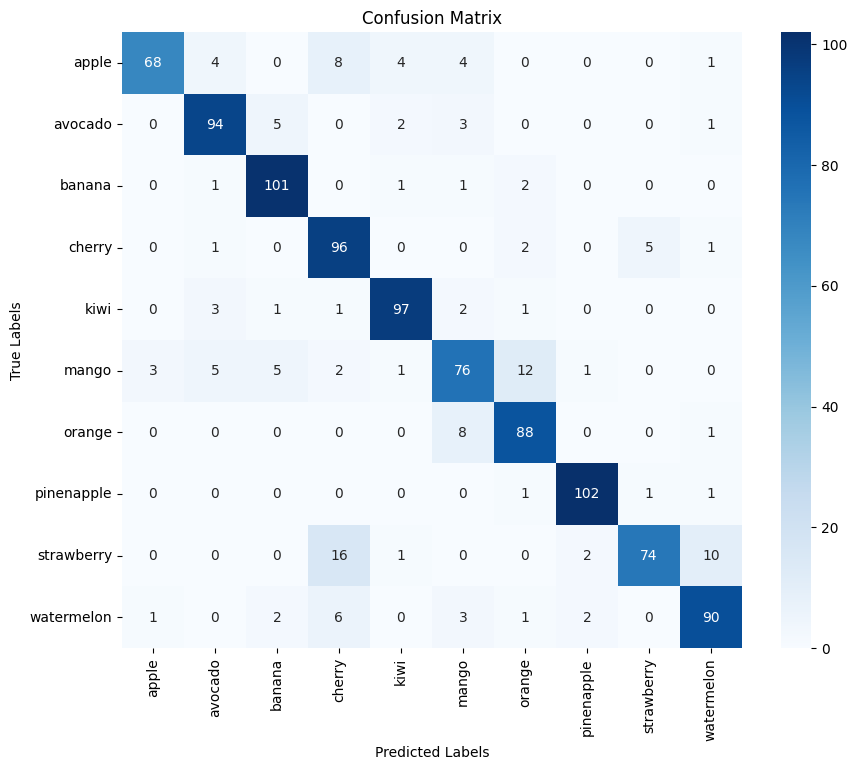

In [71]:
import seaborn as sns
import matplotlib.pyplot as plt

predictions_t = transfer_model.predict(test_ds)
predicted_classes_t = np.argmax(predictions_t, axis=1)
true_classes_t = np.concatenate([y for x, y in test_ds], axis=0)

cm = confusion_matrix(true_classes_t, predicted_classes_t)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")

In [72]:

predicted_class_counts = Counter(predicted_classes_t)

for class_index, count in predicted_class_counts.items():
    class_name = classes[class_index]  # Get the class name from the 'classes' list
    print(f"{count} {class_name} predicted.")

97 mango predicted.
72 apple predicted.
108 avocado predicted.
129 cherry predicted.
106 kiwi predicted.
105 watermelon predicted.
114 banana predicted.
107 orange predicted.
80 strawberry predicted.
107 pinenapple predicted.


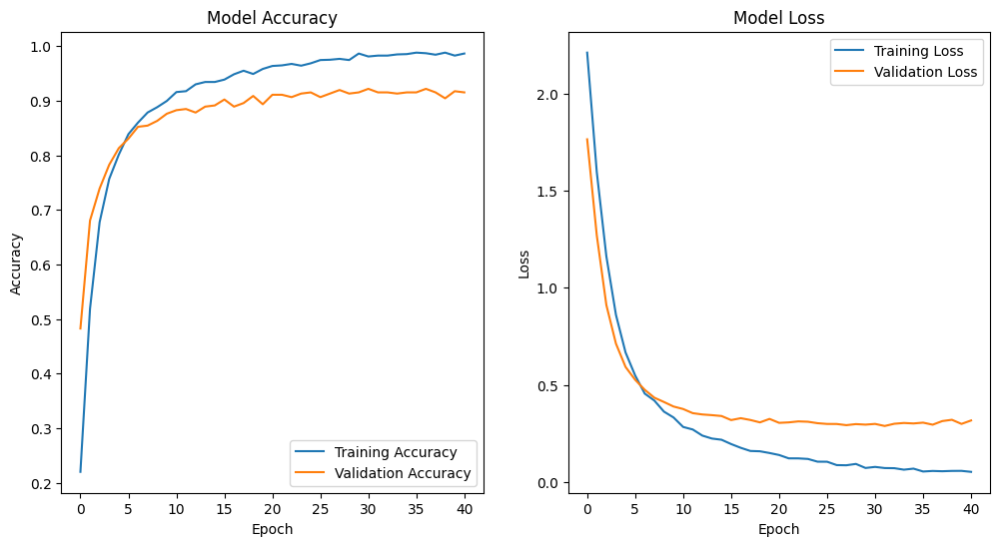

In [73]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history_transfer.history['accuracy'], label='Training Accuracy')
plt.plot(history_transfer.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(history_transfer.history['loss'], label='Training Loss')
plt.plot(history_transfer.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [74]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = transfer_model.evaluate(test_ds)
test_acc_transfer = test_accuracy
print(f"\n\nTest Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8616 - loss: 0.5236


Test Loss: 0.4765, Test Accuracy: 0.8644


In [75]:
# Generate the classification report
print(classification_report(true_classes_t, predicted_classes_t))


              precision    recall  f1-score   support

           0       0.94      0.76      0.84        89
           1       0.87      0.90      0.88       105
           2       0.89      0.95      0.92       106
           3       0.74      0.91      0.82       105
           4       0.92      0.92      0.92       105
           5       0.78      0.72      0.75       105
           6       0.82      0.91      0.86        97
           7       0.95      0.97      0.96       105
           8       0.93      0.72      0.81       103
           9       0.86      0.86      0.86       105

    accuracy                           0.86      1025
   macro avg       0.87      0.86      0.86      1025
weighted avg       0.87      0.86      0.86      1025



## Fine Tuning

We are going to unfreeze base model and reduce learning rate

In [76]:
transfer_model.trainable = True
transfer_model.compile(optimizer=tf.keras.optimizers.Adam(1e-5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [77]:
# Define the callbacks
callbacktransferFine = [
    # Save the best model based on validation accuracy
    ModelCheckpoint(
        'best_model_transfer_fine.h5',  # Path to save the best model
        save_best_only=True,  # Save only the best model
        monitor='val_loss',  # Monitor validation loss
        mode='min',  # Minimize the validation loss
        verbose=1
    ),
    # Stop training if validation loss doesn't improve for 5 epochs
    EarlyStopping(
        monitor='val_accuracy',  # Monitor validation loss
        patience=10,  # Wait for 10 epochs before stopping
        restore_best_weights=True,  # Restore best weights after stopping
        verbose=1
    )
]

In [78]:
start_time = time.time()
history_finetune = transfer_model.fit(
    train_ds,
    validation_data=val_ds,
    batch_size=batch_size,
    epochs=epoches,
    callbacks=callbacktransferFine
)
end_time = time.time()
fine_tune_training_time = end_time - start_time
print(f"Training time for deeper CNN model: {fine_tune_training_time:.2f} seconds")

Epoch 1/50
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9847 - loss: 0.0711
Epoch 1: val_loss improved from inf to 0.29381, saving model to best_model_transfer_fine.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 18s 192ms/step - accuracy: 0.9847 - loss: 0.0711 - val_accuracy: 0.9174 - val_loss: 0.2938
Epoch 2/50
51/52 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.9815 - loss: 0.0767
Epoch 2: val_loss improved from 0.29381 to 0.29075, saving model to best_model_transfer_fine.h5


52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.9816 - loss: 0.0764 - val_accuracy: 0.9196 - val_loss: 0.2907
Epoch 3/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9756 - loss: 0.0824
Epoch 3: val_loss did not improve from 0.29075
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.9760 - loss: 0.0816 - val_accuracy: 0.9239 - val_loss: 0.2910
Epoch 4/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9856 - loss: 0.0627
Epoch 4: val_loss did not improve from 0.29075
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - accuracy: 0.9857 - loss: 0.0631 - val_accuracy: 0.9217 - val_loss: 0.2916
Epoch 5/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9908 - loss: 0.0632
Epoch 5: val_loss did not improve from 0.29075
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9908 - loss: 0.0631 - val_accuracy: 0.9239 - val_loss: 0.2912
Epoch 6/50
50/52 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9858 - loss: 0.0755
Epoch 6: val_loss did not improve from 0.29075
52/52 ━━

52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9807 - loss: 0.0682 - val_accuracy: 0.9196 - val_loss: 0.2897
Epoch 13/50
49/52 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9823 - loss: 0.0749
Epoch 13: val_loss did not improve from 0.28967
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9824 - loss: 0.0745 - val_accuracy: 0.9196 - val_loss: 0.2910
Epoch 13: early stopping
Restoring model weights from the end of the best epoch: 3.
Training time for deeper CNN model: 41.82 seconds


In [79]:
# Evaluate the model on the test dataset
fine_test_loss, fine_test_accuracy = transfer_model.evaluate(test_ds)
test_acc_finetuned = fine_test_accuracy
print(f"\n\nTest Loss: {fine_test_loss:.4f}, Test Accuracy: {fine_test_accuracy:.4f}")

29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - accuracy: 0.8651 - loss: 0.5101


Test Loss: 0.4680, Test Accuracy: 0.8673


29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step


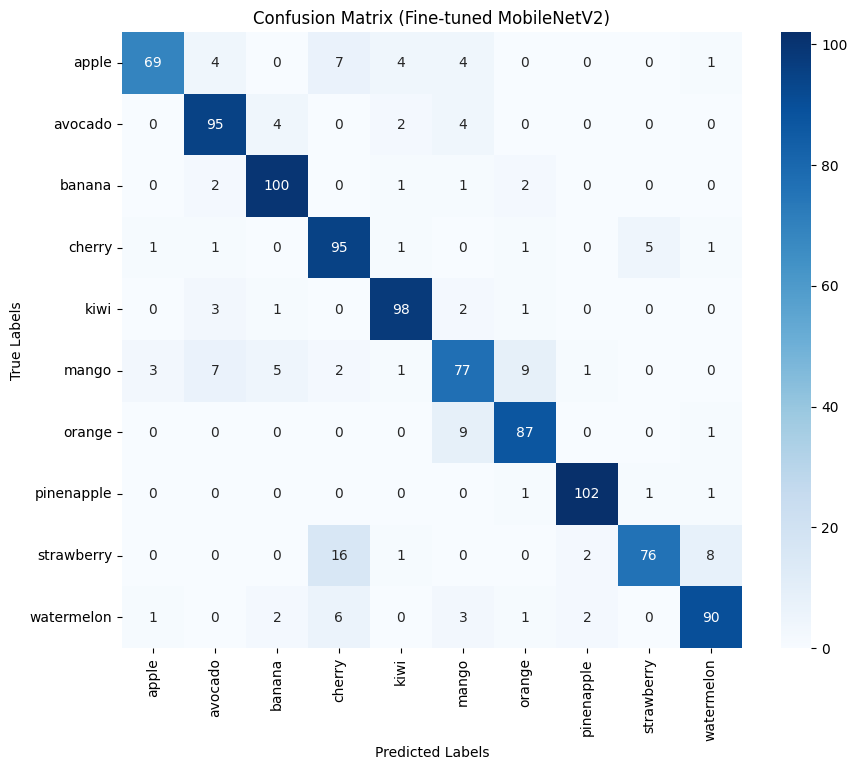

In [80]:
# Predict on the test dataset with the fine-tuned model
predictions_ft = transfer_model.predict(test_ds)
predicted_classes_ft = np.argmax(predictions_ft, axis=1)
true_classes_ft = np.concatenate([y for x, y in test_ds], axis=0)

# Create the confusion matrix
cm_ft = confusion_matrix(true_classes_ft, predicted_classes_ft)
plt.figure(figsize=(10, 8))
sns.heatmap(cm_ft, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Fine-tuned MobileNetV2)")
plt.show()

In [81]:

# Generate and print the classification report
print("\nClassification Report (Fine-tuned MobileNetV2):")
print(classification_report(true_classes_ft, predicted_classes_ft, target_names=classes))


Classification Report (Fine-tuned MobileNetV2):
              precision    recall  f1-score   support

       apple       0.93      0.78      0.85        89
     avocado       0.85      0.90      0.88       105
      banana       0.89      0.94      0.92       106
      cherry       0.75      0.90      0.82       105
        kiwi       0.91      0.93      0.92       105
       mango       0.77      0.73      0.75       105
      orange       0.85      0.90      0.87        97
  pinenapple       0.95      0.97      0.96       105
  strawberry       0.93      0.74      0.82       103
  watermelon       0.88      0.86      0.87       105

    accuracy                           0.87      1025
   macro avg       0.87      0.87      0.87      1025
weighted avg       0.87      0.87      0.87      1025



# Comparision Plots

## Evaluation Plots

In [82]:
def plot_train_val_test_accuracy_subplot(ax, history, model_name, test_accuracy):
    ax.plot(history.history['accuracy'], label='Training Accuracy', color='blue')
    ax.plot(history.history['val_accuracy'], label='Validation Accuracy', color='gold')
    ax.axhline(y=test_accuracy, color='green', linestyle='--', label=f'Test Accuracy ({test_accuracy:.4f})')
    ax.set_title(model_name)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Accuracy')
    ax.legend()
    ax.grid(True)


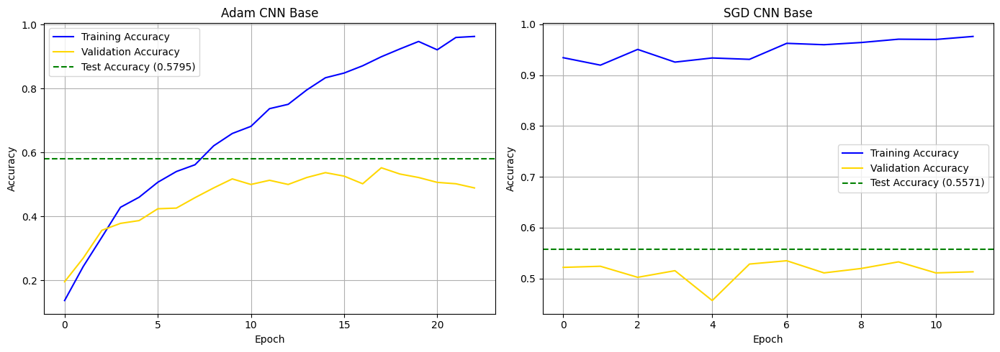

In [83]:

plt.figure(figsize=(14, 5))

# Adam
ax1 = plt.subplot(1, 2, 1)
plot_train_val_test_accuracy_subplot(ax1, history1, 'Adam CNN Base', test_acc_adam)

# SGD
ax2 = plt.subplot(1, 2, 2)
plot_train_val_test_accuracy_subplot(ax2, history2, 'SGD CNN Base', test_acc_sgd)

plt.tight_layout()
plt.show()

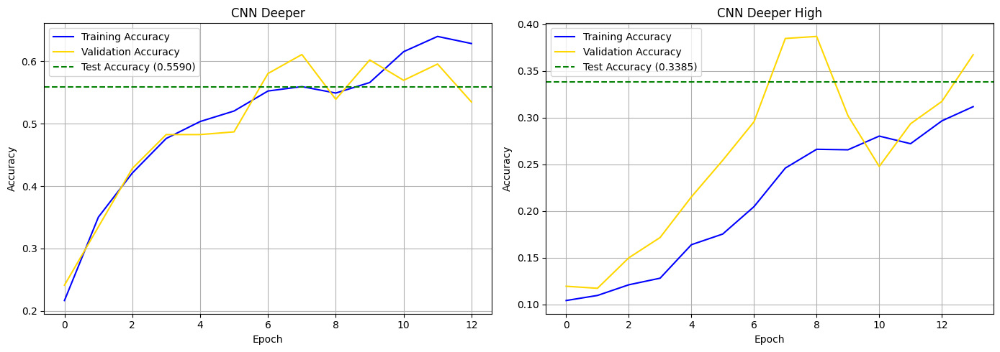

In [84]:
plt.figure(figsize=(14, 5))

# Deeper
ax1 = plt.subplot(1, 2, 1)
plot_train_val_test_accuracy_subplot(ax1, history_deeper, 'CNN Deeper', test_acc_deeper)

# Deeper Bad
ax2 = plt.subplot(1, 2, 2)
plot_train_val_test_accuracy_subplot(ax2, history_ddeeper, 'CNN Deeper High', test_acc_bad_deeper)

plt.tight_layout()
plt.show()


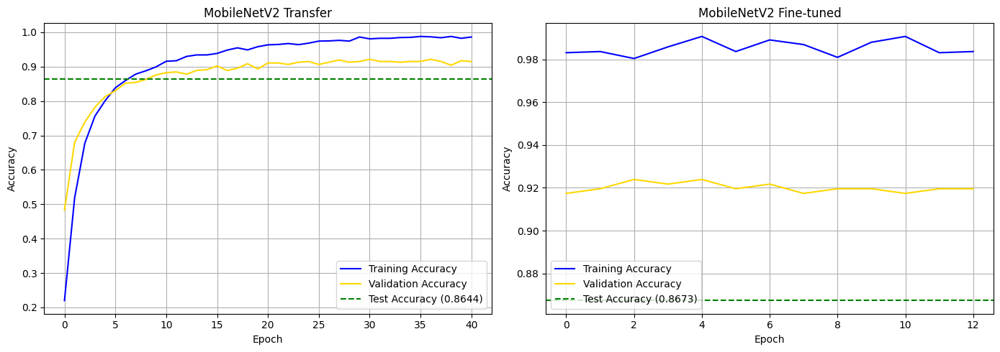

In [85]:
plt.figure(figsize=(14, 5))

# Transfer Learning
ax1 = plt.subplot(1, 2, 1)
plot_train_val_test_accuracy_subplot(ax1, history_transfer, 'MobileNetV2 Transfer', test_acc_transfer)

# Fine-tuned
ax2 = plt.subplot(1, 2, 2)
plot_train_val_test_accuracy_subplot(ax2, history_finetune, 'MobileNetV2 Fine-tuned', test_acc_finetuned)

plt.tight_layout()
plt.show()


## Load and evaluate : plots

In [86]:
from tensorflow.keras.models import load_model

# Load the best models
model_adam_cnn = load_model('best_model_adam_cnn.h5')
model_sdg_cnn = load_model('best_model_sdg_cnn.h5')
model_deeper = load_model('best_model_deeper.h5')
model_deeper_bad = load_model('best_model_deeper_bad.h5')
model_transfer = load_model('best_model_transfer.h5')
model_fine = load_model('best_model_transfer_fine.h5')



In [87]:
def evaluate_model_metrics(model, train_ds, val_ds, test_ds):
    train_loss, train_accuracy = model.evaluate(train_ds, verbose=0)
    val_loss, val_accuracy = model.evaluate(val_ds, verbose=0)
    test_loss, test_accuracy = model.evaluate(test_ds, verbose=0)
    return train_accuracy, val_accuracy, test_accuracy, test_loss


In [88]:
train_acc_adam, val_acc_adam, test_acc_adam, test_loss_adam = evaluate_model_metrics(model_adam_cnn, train_ds, val_ds, test_ds)
train_acc_sgd, val_acc_sgd, test_acc_sgd, test_loss_sgd = evaluate_model_metrics(model_sdg_cnn, train_ds, val_ds, test_ds)
train_acc_deeper, val_acc_deeper, test_acc_deeper, test_loss_deeper = evaluate_model_metrics(model_deeper, train_ds, val_ds, test_ds)
train_acc_deeper_bad, val_acc_deeper_bad, test_acc_deeper_bad, test_loss_deeper_bad = evaluate_model_metrics(model_deeper_bad, train_ds, val_ds, test_ds)
train_acc_transfer, val_acc_transfer, test_acc_transfer, test_loss_transfer = evaluate_model_metrics(model_transfer, train_ds, val_ds, test_ds)
train_acc_fine, val_acc_fine, test_acc_fine, test_loss_fine = evaluate_model_metrics(model_fine, train_ds, val_ds, test_ds)


In [89]:
model_names = ['Adam CNN Base', 'SGD CNN Base', 'CNN Deeper', 'CNN Deeper High', 'MobileNetV2 Transfer', 'MobileNetV2 Fine Tuned']

val_accuracies = [val_acc_adam, val_acc_sgd, val_acc_deeper, val_acc_deeper_bad, val_acc_transfer, val_acc_fine]
train_accuracies = [train_acc_adam, train_acc_sgd, train_acc_deeper, train_acc_deeper_bad, train_acc_transfer,train_acc_fine]
test_accuracies = [test_acc_adam, test_acc_sgd, test_acc_deeper, test_acc_deeper_bad, test_acc_transfer,test_acc_fine]
test_losses = [test_loss_adam, test_loss_sgd, test_loss_deeper, test_loss_deeper_bad, test_loss_transfer,test_loss_fine]


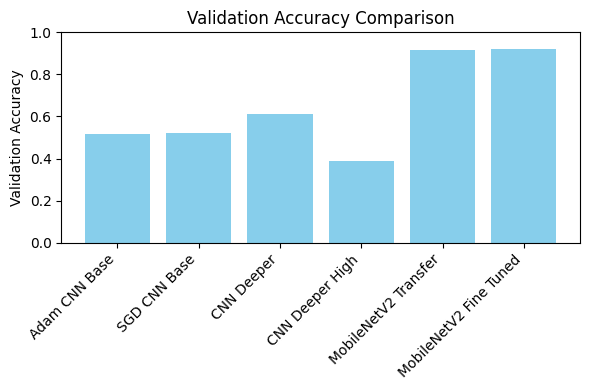

In [90]:
plt.figure(figsize=(6, 4))
plt.bar(model_names, val_accuracies, color='skyblue')
plt.ylabel('Validation Accuracy')
plt.title('Validation Accuracy Comparison')
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

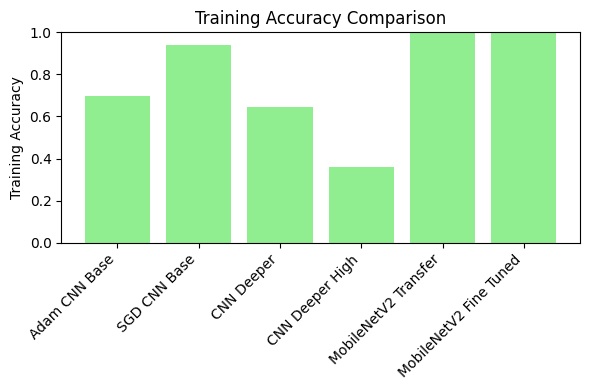

In [91]:
plt.figure(figsize=(6, 4))
plt.bar(model_names, train_accuracies, color='lightgreen')
plt.ylabel('Training Accuracy')
plt.title('Training Accuracy Comparison')
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()


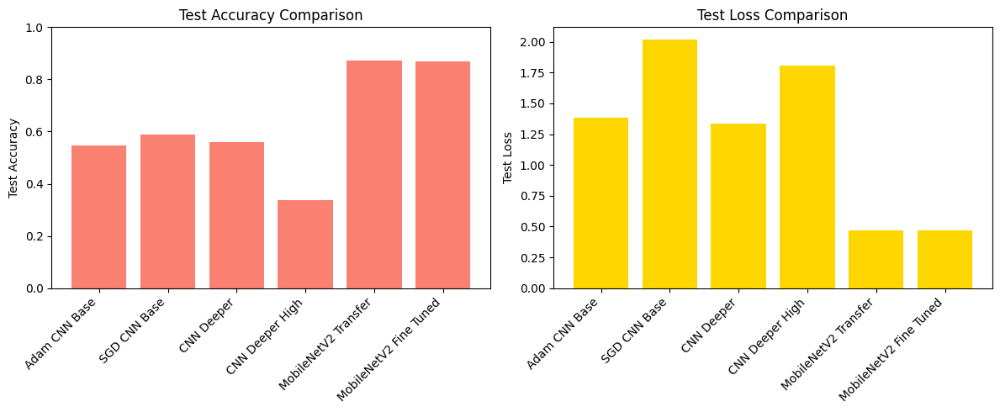

In [92]:
plt.figure(figsize=(12, 5))

# Subplot 1: Test Accuracy
plt.subplot(1, 2, 1)
plt.bar(model_names, test_accuracies, color='salmon')
plt.ylabel('Test Accuracy')
plt.title('Test Accuracy Comparison')
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1)

# Subplot 2: Test Loss
plt.subplot(1, 2, 2)
plt.bar(model_names, test_losses, color='gold')
plt.ylabel('Test Loss')
plt.title('Test Loss Comparison')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

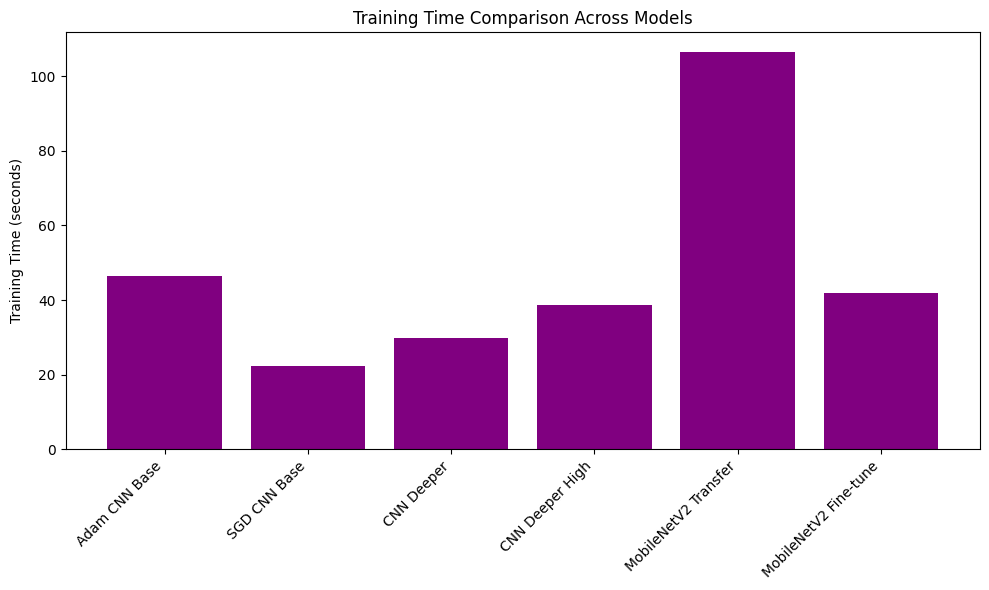

In [93]:
# Training Time Comparison
model_training_times = {
    'Adam CNN Base': training_time_adam,
    'SGD CNN Base': training_time_sgd,
    'CNN Deeper': training_time_deeper,
    'CNN Deeper High': training_time_baddeeper,
    'MobileNetV2 Transfer': training_time_transfer,
    'MobileNetV2 Fine-tune': fine_tune_training_time # Add the fine-tuning time
}

plt.figure(figsize=(10, 6))
plt.bar(model_training_times.keys(), model_training_times.values(), color='purple')
plt.ylabel('Training Time (seconds)')
plt.title('Training Time Comparison Across Models')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:

# Generate classification reports for each model
report_adam = classification_report(true_classes1, predicted_classes1, target_names=classes, output_dict=True)
report_sgd = classification_report(true_classes2, predicted_classes2, target_names=classes, output_dict=True)
report_deeper = classification_report(true_classesD, predicted_classD, target_names=classes, output_dict=True)
report_deeper_bad = classification_report(true_classes, predicted_class, target_names=classes, output_dict=True)
report_transfer = classification_report(true_classes_t, predicted_classes_t, target_names=classes, output_dict=True)
report_finetuned = classification_report(true_classes_ft, predicted_classes_ft, target_names=classes, output_dict=True)

# Extract precision for each class from each report
precision_data = {}
model_reports = {
    'Adam CNN Base': report_adam,
    'SGD CNN Base': report_sgd,
    'CNN Deeper': report_deeper,
    'CNN Deeper High': report_deeper_bad,
    'MobileNetV2 Transfer': report_transfer,
    'MobileNetV2 Fine Tuned': report_finetuned
}

for model_name, report in model_reports.items():
    precision_data[model_name] = {class_name: report[class_name]['precision'] for class_name in classes}

# Create a Pandas DataFrame
precision_df = pd.DataFrame(precision_data)

# Display the table
print("Precision of each class by each model:")
print(precision_df.round(4))


Precision of each class by each model:
            Adam CNN Base  SGD CNN Base  CNN Deeper  CNN Deeper High  \
apple              0.6533        0.5529      0.8261           0.0000   
avocado            0.5047        0.5340      0.4398           0.2000   
banana             0.4872        0.3636      0.5288           0.3023   
cherry             0.6606        0.6827      0.4724           0.4691   
kiwi               0.5556        0.5275      0.5275           0.2555   
mango              0.4333        0.3800      0.5789           0.1250   
orange             0.7212        0.6842      0.9157           0.4725   
pinenapple         0.7073        0.7168      0.7131           0.0000   
strawberry         0.6452        0.6207      0.4268           0.4032   
watermelon         0.4422        0.5529      0.5753           0.0000   

            MobileNetV2 Transfer  MobileNetV2 Fine Tuned  
apple                     0.9444                  0.9324  
avocado                   0.8704                  

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:

# Combine the accuracy values and model names
model_names = ['Adam CNN Base', 'SGD CNN Base', 'CNN Deeper', 'CNN Deeper High', 'MobileNetV2 Transfer', 'MobileNetV2 Fine Tuned']
accuracies = [test_acc_adam, test_acc_sgd, test_acc_deeper, test_acc_deeper_bad, test_acc_transfer, test_acc_finetuned]

# Create a DataFrame to display the results
accuracy_df = pd.DataFrame({
    'Model': model_names,
    'Test Accuracy': accuracies
})

# Print the accuracy table
print("Test Accuracy of Each Model:")
print(accuracy_df.round(4))

Test Accuracy of Each Model:
                    Model  Test Accuracy
0           Adam CNN Base         0.5454
1            SGD CNN Base         0.5902
2              CNN Deeper         0.5590
3         CNN Deeper High         0.3385
4    MobileNetV2 Transfer         0.8732
5  MobileNetV2 Fine Tuned         0.8673


## Plots summary

**Adam Vs SGD**<br>
Viewing the Performance, Both of the optimisers are optimal and have minimal differences with them but we choose adam because of its simplicity and easy of use.
<br><br>
**Deeper Model: 2 different architectures**<br>
I have 2 different architectures for deeper model. One has all the layers with normalisation and layers with high parameters have dropouts. This model did not perform well hence is called CNN Deeper Bad
Another architecture only uses dropout and Batch Normalisation on a place it needed (Dense Layer - I) and otherwise, only layers are added.
<br><br>
**Base Model Vs Deeper Model**<br>
Although deeper model has more regulizers, it still did not perform relatively better than base model. Both models have similar performance with deeper model having slight improvement ( around 5%)
<br><br>
**Transfer Learning and Fine Tuning**<br>
Both models worked similarly even though fine tuned model was allowed to update weights and was trained with smaller learing rates. This is the pinnacle this model has performed but still the best is 68% accuracy.
<br><br>
**Scratch CNN vs Transfer Learning**<br>
As we could see, scratch implementation could maximum reach accuracy of ~55% and Transfer learning has 87% accuracy. Although model prediction has improved by a lot, unless the dataset is consistent, accuracy cannot rise more higher.


# Appendix

1. Why only in first Convulation layer only is input shape introduced?
- Because first layer introduces the shape to the model and afterwards the output feature map is used for the input shape.
<br><br>
2. What is CNN model used here?
- CNN model is used to extract features from images to distinguish each images features within different other classes
<br><br>
3. Difference between relu and softmax activation functions being used in the function
- Relu is used as a threshold function in which the values ranges from `0 to max(value)` so that it can extract features and see a pattern in them as a threshold.
- Softmax activation is a classifier which selects the highest possibility from the output and assigns that value to the prediction.